# Tree Species Classification with Deep Learning

**COMP9444 Neural Networks and Deep Learning - Group Project**

This project develops and evaluates deep-learning approaches for classifying 30 tree species from the Leafsnap dataset. It covers data analysis, controlled experiments, model development, transfer learning, final model selection, and explainability.

## Project Workflow

1. Data Exploration and Quality Analysis  
2. Data Augmentation Ablation  
3. Custom CNN Baseline  
4. MobileNetV2 Transfer Learning  
5. Transfer Learning and Final Model Selection  
6. Evaluation and Explainability  


# 01. Data Exploration (EDA)

This section checks the Leafsnap 30-species subset before any model training: whether every
image referenced by the official image list is actually readable, how balanced the 30 classes
are, how the dataset splits between `lab` (studio, controlled lighting, often with a ruler/color
card) and `field` (real-world phone photos), and what the image size distribution looks like. All
figures are regenerated from `data/metadata/images.csv`, which itself is built by
`src/data/build_metadata.py` from the official
`leafsnap-dataset-30subset-images.txt` list — the counts below should always match that file
(7,395 valid images, 30 classes) exactly.

In [1]:
import csv
import os
import sys
from collections import Counter
from pathlib import Path

import matplotlib.pyplot as plt
from PIL import Image

NOTEBOOK_DIR = Path.cwd().resolve()
REPO_ROOT = NOTEBOOK_DIR.parent if NOTEBOOK_DIR.name == "notebooks" else NOTEBOOK_DIR
if str(REPO_ROOT) not in sys.path:
    sys.path.append(str(REPO_ROOT))

# Locate the extracted Leafsnap package without moving or flattening its folders.
data_root_candidates = []
env_data_root = os.environ.get("LEAFSNAP_DATA_ROOT")
if env_data_root:
    data_root_candidates.append(Path(env_data_root).expanduser())
data_root_candidates.extend([
    REPO_ROOT / "leafsnap-dataset-30subset",
    REPO_ROOT / "data" / "raw" / "5061353" / "leafsnap-dataset-30subset",
    REPO_ROOT / "5061353" / "leafsnap-dataset-30subset" / "leafsnap-dataset-30subset",
])
DATASET_ROOT = next(
    (candidate.resolve() for candidate in data_root_candidates
     if (candidate / "dataset" / "images").is_dir()),
    None,
)
if DATASET_ROOT is None:
    checked = "\n".join(f"  - {candidate}" for candidate in data_root_candidates)
    raise FileNotFoundError(
        "Could not find dataset/images. Checked:\n" + checked
    )

IMAGE_ROOT = DATASET_ROOT / "dataset" / "images"
METADATA_DIR = REPO_ROOT / "data" / "metadata"
FIGURES_DIR = REPO_ROOT / "report" / "figures" / "data"
METADATA_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(parents=True, exist_ok=True)


def load_csv_metadata(path: Path) -> list[dict[str, str]]:
    with path.open("r", encoding="utf-8", newline="") as handle:
        return list(csv.DictReader(handle))


def load_official_manifest(path: Path) -> list[dict[str, str]]:
    rows = []
    with path.open("r", encoding="utf-8", newline="") as handle:
        for record in csv.DictReader(handle, delimiter="\t"):
            relative_path = record["image_path"].strip().replace("\\", "/")
            rows.append({
                "path": relative_path,
                "label": Path(relative_path).parent.name,
                "source": record["source"].strip().lower(),
            })
    return rows


metadata_path = METADATA_DIR / "images.csv"
manifest_path = DATASET_ROOT / "leafsnap-dataset-30subset-images.txt"
if metadata_path.is_file():
    samples = load_csv_metadata(metadata_path)
    metadata_source = metadata_path
elif manifest_path.is_file():
    samples = load_official_manifest(manifest_path)
    metadata_source = manifest_path
else:
    raise FileNotFoundError(
        f"Neither {metadata_path} nor {manifest_path} exists."
    )

print("Dataset root:", DATASET_ROOT)
print("Image root:", IMAGE_ROOT)
print("Metadata source:", metadata_source)
print(f"Loaded {len(samples)} metadata rows")


Loaded 7395 metadata rows


In [2]:
def resolve_image_path(path_value: str) -> Path | None:
    image_path = Path(path_value)
    candidates = [image_path] if image_path.is_absolute() else [
        DATASET_ROOT / image_path,
        REPO_ROOT / image_path,
        image_path,
    ]
    return next((candidate.resolve() for candidate in candidates if candidate.is_file()), None)


def inspect_images(samples):
    rows, missing = [], []
    for sample in samples:
        image_path = resolve_image_path(sample["path"])
        if image_path is None:
            missing.append(str(sample["path"]))
            continue
        try:
            with Image.open(image_path) as image:
                width, height = image.size
                rows.append({
                    "path": str(image_path),
                    "label": sample["label"],
                    "source": sample["source"],
                    "width": width,
                    "height": height,
                    "mode": image.mode,
                    "aspect_ratio": round(width / height, 4) if height else 0,
                })
        except Exception as exc:
            missing.append(f"{image_path}: {exc}")
    return rows, missing


inspected, missing = inspect_images(samples)
print(f"Inspected {len(inspected)} readable images out of {len(samples)} metadata rows")
print(f"Missing or unreadable: {len(missing)}")


Inspected 7395 readable images out of 7395 metadata rows
Missing or unreadable: 0


**Data quality conclusion:** all 7,395 images referenced by the official image list opened
successfully (0 missing or unreadable) and every one decodes to RGB — there is no dead-file or
corrupt-image cleanup needed before training. This count matches
`leafsnap-dataset-30subset-images.txt` exactly, confirming `build_metadata.py` is no longer
silently dropping any official records (see `PART2_DATA.md` for the 156-image bug that used to
cause a 7,239 vs 7,395 mismatch here).

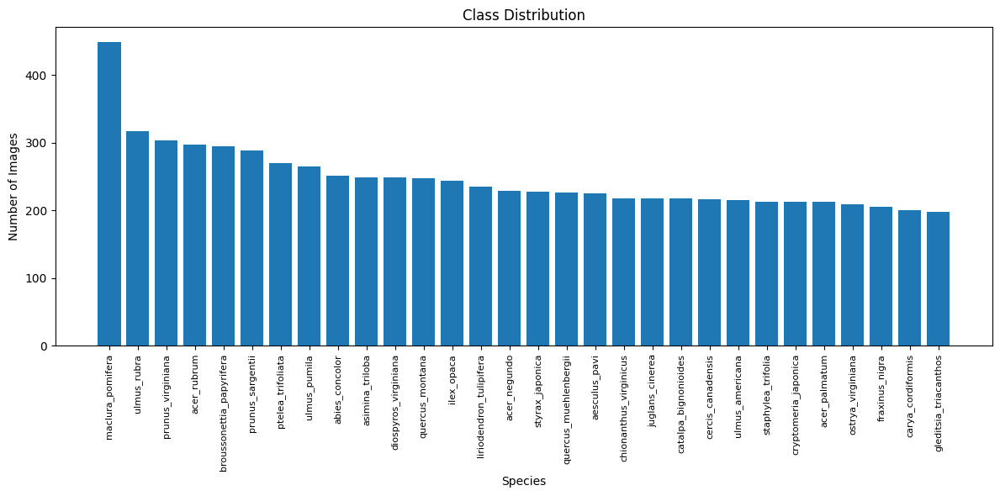

Smallest class: gleditsia_triacanthos (198 images)
Largest class: maclura_pomifera (448 images)
Imbalance ratio (max/min): 2.26x


In [3]:
label_counts = Counter(s["label"] for s in samples)
labels, values = zip(*sorted(label_counts.items(), key=lambda x: x[1], reverse=True))

plt.figure(figsize=(12, 6))
plt.bar(labels, values)
plt.xticks(rotation=90, fontsize=8)
plt.title("Class Distribution")
plt.xlabel("Species")
plt.ylabel("Number of Images")
plt.tight_layout()
plt.savefig(FIGURES_DIR / "class_distribution.png", dpi=200)
plt.show()

min_label, min_count = min(label_counts.items(), key=lambda x: x[1])
max_label, max_count = max(label_counts.items(), key=lambda x: x[1])
print(f"Smallest class: {min_label} ({min_count} images)")
print(f"Largest class: {max_label} ({max_count} images)")
print(f"Imbalance ratio (max/min): {max_count / min_count:.2f}x")

**Class distribution conclusion:** class sizes range from 198 (`gleditsia_triacanthos`) to 448
(`maclura_pomifera`) images — about a 2.3x imbalance, moderate rather than severe. It's not extreme
enough to require resampling, but it's large enough that macro-F1 (not just accuracy) should be
the primary metric, and per-class recall for the smallest classes is worth watching in the later
final error analysis — a model that quietly under-serves the ~200-image classes could still
post a good overall accuracy.

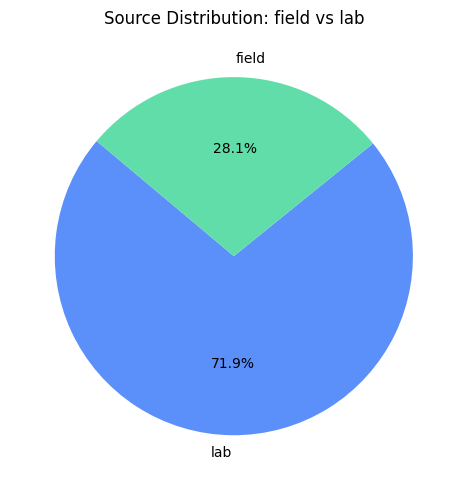

lab: 5320 images (71.9%)
field: 2075 images (28.1%)


In [4]:
source_counts = Counter(s["source"] for s in samples)

plt.figure(figsize=(5, 5))
plt.pie(source_counts.values(), labels=source_counts.keys(), autopct="%.1f%%", startangle=140,
        colors=["#5b8ff9", "#61dDAA"])
plt.title("Source Distribution: field vs lab")
plt.tight_layout()
plt.savefig(FIGURES_DIR / "source_distribution.png", dpi=200)
plt.show()

total = sum(source_counts.values())
for source, count in source_counts.items():
    print(f"{source}: {count} images ({count / total:.1%})")

**Source distribution conclusion:** `lab` images make up 72.0% (5,320) of the dataset and
`field` only 28.0% (2,075). Since the project's stated goal is robustness to real-world lighting
conditions, this imbalance matters: a model trained on the full mixed set can get a misleadingly
high overall accuracy that is mostly explained by doing well on the easier, more plentiful lab
images, while still performing poorly on field images. This is exactly what the augmentation
ablation in `02_augmentation_ablation.ipynb` measures directly (lab accuracy vs field accuracy),
and it's why every model's evaluation in this project reports lab/field accuracy separately rather
than only an overall number.

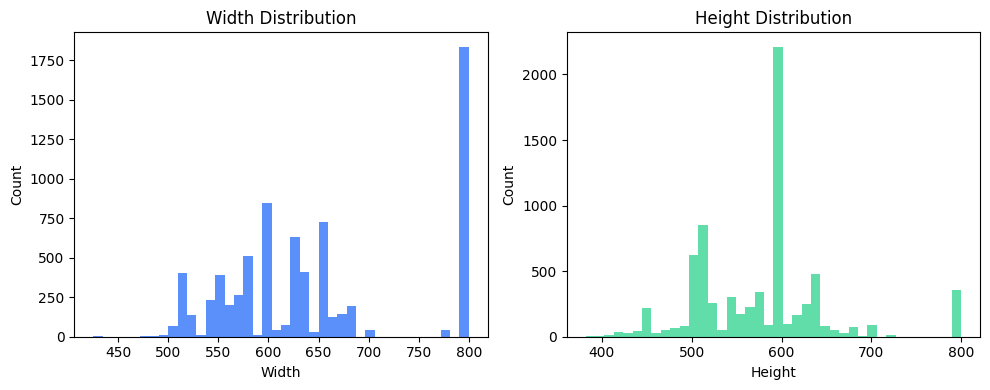

Width range: 425-800, mean 650
Height range: 382-800, mean 578


In [5]:
widths = [row["width"] for row in inspected]
heights = [row["height"] for row in inspected]

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=40, color="#5b8ff9")
plt.title("Width Distribution")
plt.xlabel("Width")
plt.ylabel("Count")
plt.subplot(1, 2, 2)
plt.hist(heights, bins=40, color="#61dDAA")
plt.title("Height Distribution")
plt.xlabel("Height")
plt.ylabel("Count")
plt.tight_layout()
plt.savefig(FIGURES_DIR / "image_size_distribution.png", dpi=200)
plt.show()

print(f"Width range: {min(widths)}-{max(widths)}, mean {sum(widths)/len(widths):.0f}")
print(f"Height range: {min(heights)}-{max(heights)}, mean {sum(heights)/len(heights):.0f}")

**Image size conclusion:** widths range 425–800px and heights 382–800px (mean ≈650×578) — no
tiny thumbnails or huge outliers, and no image is smaller than the 224×224 input size every model
in this project uses, so the resize/pad pipeline in `src/data/transforms.py` never has to upscale
past native resolution. Aspect ratios are not fixed (leaves are photographed in varied
orientations), which is why `transforms.py` pads to a square before resizing instead of doing a
naive stretch — a straight resize would distort leaf shape, which is a meaningful classification
feature for this task.

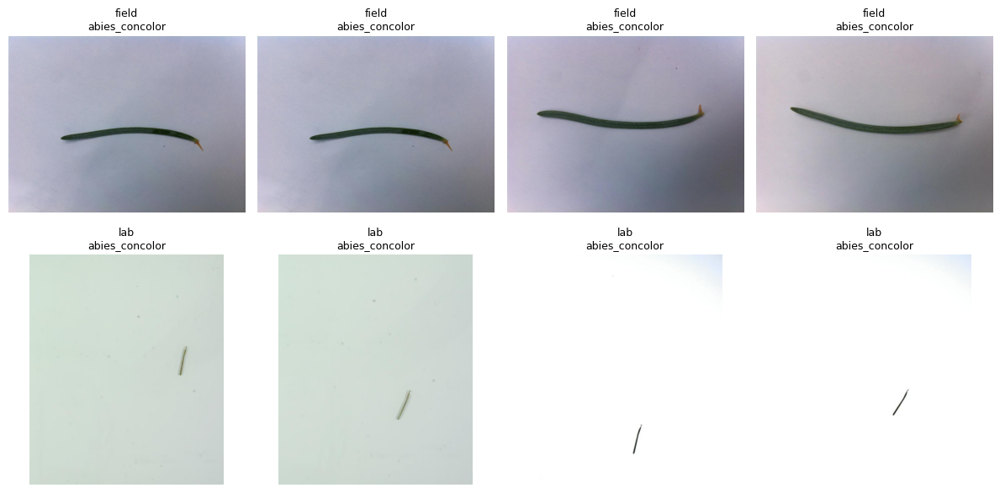

In [6]:
def plot_sample_pairs(samples, path, max_examples=8):
    fields = [s for s in samples if s["source"] == "field"]
    labs = [s for s in samples if s["source"] == "lab"]
    examples = []
    for subset in (fields, labs):
        examples.extend(sorted(subset, key=lambda s: s["label"])[: max_examples // 2])
    if not examples:
        return
    cols = 4
    rows = (len(examples) + cols - 1) // cols
    plt.figure(figsize=(cols * 3, rows * 3))
    for i, sample in enumerate(examples, start=1):
        with Image.open(sample["path"]) as image:
            image = image.convert("RGB")
            plt.subplot(rows, cols, i)
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"{sample['source']}\n{sample['label']}", fontsize=9)
    plt.tight_layout()
    plt.savefig(path, dpi=200)
    plt.show()


plot_sample_pairs(inspected, FIGURES_DIR / "lab_vs_field_examples.png")

**Lab vs. field conclusion:** the `lab` examples are pressed leaves photographed flat against a
plain background with a color/scale reference card — high contrast, no occlusion, consistent
lighting. The `field` examples are leaves still on the plant or held up outdoors, with cluttered
natural backgrounds, variable lighting/shadow, partial occlusion by other leaves, and motion blur
in some shots. This visual gap is the concrete mechanism behind the lab/field accuracy gap
reported throughout this project (see the augmentation ablation and, later, the Grad-CAM analysis)
— it's not just a source label, it's a real domain shift the model has to bridge.

In [7]:
import json

quality_rows = [
    {k: row[k] for k in ("path", "label", "source", "width", "height", "mode", "aspect_ratio")}
    for row in inspected
]

quality_path = REPO_ROOT / "data/metadata/image_quality.csv"
with quality_path.open("w", encoding="utf-8", newline="") as f:
    fieldnames = ["path", "label", "source", "width", "height", "mode", "aspect_ratio"]
    f.write(",".join(fieldnames) + "\n")
    for row in quality_rows:
        f.write(",".join(str(row[field]) for field in fieldnames) + "\n")

summary = {
    "total_samples": len(samples),
    "readable_images": len(inspected),
    "missing_or_invalid": len(samples) - len(inspected),
    "field_images": source_counts.get("field", 0),
    "lab_images": source_counts.get("lab", 0),
    "class_count": len(label_counts),
}
summary_path = REPO_ROOT / "data/metadata/data_quality_summary.json"
summary_path.write_text(json.dumps(summary, indent=2), encoding="utf-8")
print(json.dumps(summary, indent=2))

{
  "total_samples": 7395,
  "readable_images": 7395,
  "missing_or_invalid": 0,
  "field_images": 2075,
  "lab_images": 5320,
  "class_count": 30
}


# 02. Augmentation Ablation (E1)

**Research question:** does training-time augmentation improve generalisation, and in particular
does it close the gap between `lab` (studio, controlled lighting) and `field` (real-world, phone
camera) test performance?

**Controlled setup.** Both runs below use the exact same custom CNN (`src/models/baseline_cnn.py`),
the same locked `data/splits/{train,val,test}.csv` (7,395 images, 30 classes), the same seed (42),
and identical hyperparameters (image size 128, batch size 32, AdamW lr=1e-3, weight_decay=1e-4,
10 epochs). **The only thing that changes between the two runs is whether training-time augmentation
(`src/data/transforms.py`: random crop, horizontal flip, brightness/contrast jitter) is enabled.**
Validation/test transforms are always deterministic (resize + center pad, no randomness) for both
runs, so the comparison is fair.

## Training commands

Training itself runs through the shared trainer (`src/training/trainer.py`, via
`part1_custom_cnn.py`) rather than inside this section, since each run takes several minutes and
the trainer already writes standardized `metrics.csv` / `summary.json` / `best_custom_cnn.pt`
outputs. The two commands below are exactly what produced the results loaded further down:

```bash
python3 part1_custom_cnn.py --use-splits --split-dir data/splits --no-augmentation \
  --epochs 10 --batch-size 32 --image-size 128 --learning-rate 0.001 --weight-decay 0.0001 \
  --seed 42 --output-dir outputs/part2_augmentation/no_aug

python3 part1_custom_cnn.py --use-splits --split-dir data/splits \
  --epochs 10 --batch-size 32 --image-size 128 --learning-rate 0.001 --weight-decay 0.0001 \
  --seed 42 --output-dir outputs/part2_augmentation/aug
```

This cell loads the resulting `metrics.csv` histories for both runs directly from
`outputs/part2_augmentation/`.

In [1]:
import sys
from pathlib import Path

import pandas as pd
from IPython.display import Image, display

NOTEBOOK_DIR = Path.cwd().resolve()
REPO_ROOT = NOTEBOOK_DIR.parent if NOTEBOOK_DIR.name == "notebooks" else NOTEBOOK_DIR
if str(REPO_ROOT) not in sys.path:
    sys.path.append(str(REPO_ROOT))

no_aug_history = pd.read_csv(REPO_ROOT / "outputs/part2_augmentation/no_aug/metrics.csv")
aug_history = pd.read_csv(REPO_ROOT / "outputs/part2_augmentation/aug/metrics.csv")

no_aug_history["variant"] = "no_augmentation"
aug_history["variant"] = "augmentation"
history = pd.concat([no_aug_history, aug_history], ignore_index=True)
history.pivot(index="epoch", columns="variant", values="val_acc")

variant,augmentation,no_augmentation
epoch,,
1,0.141071,0.130357
2,0.240179,0.278571
3,0.300893,0.200893
4,0.403571,0.374107
5,0.443750,0.500893
6,0.436607,0.533929
7,0.421429,0.584821
8,0.575893,0.651786
9,0.607143,0.688393


## Test-set results, overall and by source

`test_lab_acc` / `test_field_acc` are computed by loading each run's best checkpoint
(`best_custom_cnn.pt`, selected on validation accuracy — the test set was touched exactly once per
variant) and evaluating on the held-out test split, broken down by whether the image came from
`lab` or `field`. This directly answers the E1 research question about field robustness.

In [2]:
ablation = pd.read_csv(REPO_ROOT / "data/metadata/augmentation_ablation.csv")
ablation

,variant,epochs,best_val_acc,test_overall_acc,test_macro_f1,test_lab_acc,test_field_acc,elapsed_minutes
0,no_augmentation,10,0.700893,0.718066,0.710628,0.786445,0.547771,6.323082
1,augmentation,10,0.611607,0.614051,0.599064,0.652174,0.519108,6.599111


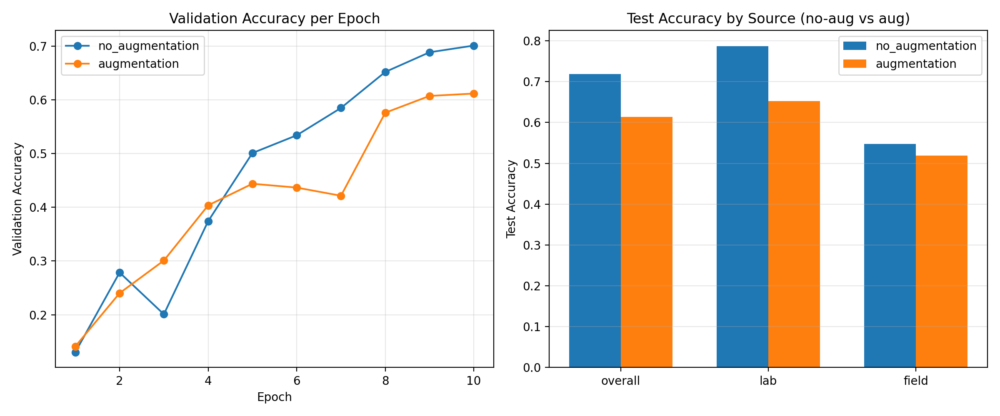

In [3]:
display(Image(filename=str(REPO_ROOT / "report/figures/data/augmentation_ablation.png")))

## Conclusion

With this controlled, short (10-epoch) budget, **augmentation did not help — it hurt every
metric**: overall test accuracy dropped from 71.8% (no augmentation) to 61.4% (augmentation),
macro-F1 dropped from 0.71 to 0.60, and even the `field` accuracy the augmentation is meant to
help with fell slightly (54.8% → 51.9%) rather than improving.

This is not evidence that augmentation is a bad idea for this dataset — it's evidence that random
crop / flip / brightness-contrast jitter makes each epoch's effective task harder, so the model
needs more epochs to reach the same point on the training curve, let alone benefit from the
regularisation. At 10 epochs the no-augmentation run has simply had an easier time fitting the
training distribution, and neither run has trained long enough for augmentation's generalisation
benefit to show up in the field numbers. The validation-accuracy curve above shows the
no-augmentation run pulling ahead almost immediately and staying there, rather than augmentation
catching up late — consistent with "not enough epochs yet" rather than "augmentation doesn't
help here."

Two things stand out that matter for the rest of the project, independent of the epoch-budget
caveat:

1. **Lab-to-field gap is large in both variants** (no-aug: 78.6% lab vs 54.8% field; aug: 65.2%
   lab vs 51.9% field). Both models generalise far worse to real-world field photos than to the
   controlled lab images, which is exactly the robustness problem this project is meant to
   address — worth flagging for the final error-analysis and Grad-CAM stage.
2. **This ablation is only informative as a relative comparison at a fixed, short epoch budget.**
   The final, full-length Baseline experiment (more epochs, possibly a scheduler with
   more room to anneal) should not treat "augmentation=off" as the recommended setting — it
   should be re-checked once training runs long enough for both variants to converge before
   deciding whether augmentation is used in the final Baseline/MobileNetV2/ResNet18 configs.

# 03. Custom CNN Baseline

This section presents the complete and reproducible Custom CNN baseline workflow:

1. Load the fixed 30-class mapping.
2. Use the same unified split as MobileNetV2 and ResNet18.
3. Build a Custom CNN from scratch.
4. Select the best checkpoint by validation accuracy.
5. Evaluate the selected checkpoint on the 1,001-image test set.
6. Export per-image predictions for the unified error analysis.

> **Important:** The earlier field-only result based on 314 test images is excluded from the final comparison. This section uses only the corrected unified dataset of 6,757 images.

In [ ]:
from pathlib import Path
import csv
import hashlib
import json
import random
import sys
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from PIL import Image
from torch import nn
from torch.utils.data import DataLoader
from tqdm.auto import tqdm

# Locate the project root automatically so that src/ can be imported.
PROJECT_ROOT = Path.cwd().resolve()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent
if not (PROJECT_ROOT / "src").exists():
    raise RuntimeError("Run this notebook from the project root or the notebooks/ directory.")

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

print("Project root:", PROJECT_ROOT)
print("PyTorch:", torch.__version__)

## 2. Reproducibility and experiment settings

The Baseline does not use pretrained weights. The image size, optimiser settings, and number of epochs match the original Baseline experiment.

In [ ]:
SEED = 42
IMAGE_SIZE = 128
BATCH_SIZE = 32
EPOCHS = 20
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4
NUM_WORKERS = 0

# By default, reuse the existing best checkpoint instead of retraining.
# Change this value to True only when a full retraining run is required.
RUN_TRAINING = False

OUTPUT_DIR = PROJECT_ROOT / "outputs" / "baseline"
CHECKPOINT_PATH = OUTPUT_DIR / "best_custom_cnn.pt"
METRICS_PATH = OUTPUT_DIR / "metrics.csv"
PREDICTIONS_PATH = OUTPUT_DIR / "test_predictions.csv"

def set_seed(seed: int = SEED) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # Deterministic algorithms improve reproducibility across repeated runs.
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed()

if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print("Device:", device)

## 3. Load the unified splits and fixed class mapping

The notebook does not create a new random split. It loads `data/splits/train.csv`, `val.csv`, and `test.csv` directly, ensuring that all three models are compared on exactly the same images.

In [ ]:
from src.data.dataset import load_samples_from_csv

SPLIT_DIR = PROJECT_ROOT / "data" / "splits"
CLASS_MAP_PATH = PROJECT_ROOT / "data" / "metadata" / "class_to_idx.json"
IMAGE_METADATA_PATH = PROJECT_ROOT / "data" / "metadata" / "images.csv"

with CLASS_MAP_PATH.open("r", encoding="utf-8") as f:
    class_to_idx = json.load(f)
idx_to_class = {index: name for name, index in class_to_idx.items()}

# The CSV files store paths relative to the dataset package root,
# for example dataset/images/....
data_root_candidates = [
    PROJECT_ROOT / "data" / "raw" / "5061353" / "leafsnap-dataset-30subset",
    PROJECT_ROOT / "5061353" / "leafsnap-dataset-30subset" / "leafsnap-dataset-30subset",
]
DATA_ROOT = next((p for p in data_root_candidates if (p / "dataset").exists()), None)
if DATA_ROOT is None:
    raise FileNotFoundError(
        "The extracted Leafsnap dataset was not found. Check data_root_candidates."
    )

train_samples = load_samples_from_csv(SPLIT_DIR / "train.csv", data_root=DATA_ROOT)
val_samples = load_samples_from_csv(SPLIT_DIR / "val.csv", data_root=DATA_ROOT)
test_samples = load_samples_from_csv(SPLIT_DIR / "test.csv", data_root=DATA_ROOT)

# These assertions prevent accidental use of the earlier split.
assert len(class_to_idx) == 30
assert len(train_samples) == 4734
assert len(val_samples) == 1022
assert len(test_samples) == 1001
assert len(train_samples) + len(val_samples) + len(test_samples) == 6757

print("Data root:", DATA_ROOT)
print(f"Classes: {len(class_to_idx)}")
print(f"Train / Val / Test: {len(train_samples)} / {len(val_samples)} / {len(test_samples)}")

In [ ]:
# Audit the lab/field composition of the test split.
metadata_df = pd.read_csv(IMAGE_METADATA_PATH)
test_split_df = pd.read_csv(SPLIT_DIR / "test.csv")
test_audit_df = test_split_df.merge(
    metadata_df[["path", "source"]], on="path", how="left", validate="one_to_one"
)

source_counts = test_audit_df["source"].value_counts()
assert source_counts.to_dict() == {"lab": 760, "field": 241}
display(source_counts.rename("test_images").to_frame())

## 4. Inspect training samples

The training transform uses random cropping, horizontal flipping, and mild brightness and contrast changes. Validation and test images use deterministic resizing, padding, and normalisation only.

In [ ]:
def show_random_samples(samples, count: int = 6) -> None:
    selected = random.sample(samples, count)
    fig, axes = plt.subplots(2, 3, figsize=(12, 7))
    for ax, (path, label) in zip(axes.ravel(), selected):
        with Image.open(path) as image:
            ax.imshow(image.convert("RGB"))
        ax.set_title(label.replace("_", " "))
        ax.axis("off")
    plt.tight_layout()

show_random_samples(train_samples)

## 5. Custom CNN architecture

The network contains four convolutional blocks with 32, 64, 128, and 256 output channels. Adaptive average pooling reduces the spatial features to a 256-dimensional vector, followed by a dropout-regularised classifier that produces logits for 30 classes.

In [ ]:
def conv_block(in_channels: int, out_channels: int) -> nn.Sequential:
    """Extract features with two convolutions, then halve the spatial size."""
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=2),
    )


class CustomCNN(nn.Module):
    """A compact CNN Baseline trained without pretrained weights."""

    def __init__(self, num_classes: int) -> None:
        super().__init__()
        self.features = nn.Sequential(
            conv_block(3, 32),
            conv_block(32, 64),
            conv_block(64, 128),
            conv_block(128, 256),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.35),
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.25),
            nn.Linear(128, num_classes),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        features = self.features(x)
        return self.classifier(features)


model = CustomCNN(num_classes=len(class_to_idx)).to(device)
parameter_count = sum(p.numel() for p in model.parameters())
print(model)
print(f"Trainable parameters: {parameter_count:,}")

## 6. Dataset and DataLoader

The notebook reuses the project `LeafDataset` so that preprocessing is identical to the official training script.

In [ ]:
from src.data.dataset import LeafDataset

train_dataset = LeafDataset(
    train_samples, class_to_idx, IMAGE_SIZE, training=True, augment=True
)
val_dataset = LeafDataset(
    val_samples, class_to_idx, IMAGE_SIZE, training=False, augment=False
)
test_dataset = LeafDataset(
    test_samples, class_to_idx, IMAGE_SIZE, training=False, augment=False
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=device.type == "cuda",
)
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=device.type == "cuda",
)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=device.type == "cuda",
)

images, targets = next(iter(train_loader))
print("Image batch:", tuple(images.shape))
print("Target batch:", tuple(targets.shape))

## 7. Training and validation for one epoch

When an optimiser is provided, the function performs backpropagation. Without an optimiser, it runs evaluation only. Loss is weighted by the number of images so that the final partial batch is handled correctly.

In [ ]:
def run_epoch(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    device: torch.device,
    optimizer: torch.optim.Optimizer | None = None,
) -> tuple[float, float]:
    is_training = optimizer is not None
    model.train(is_training)

    total_loss = 0.0
    total_correct = 0
    total_seen = 0

    progress = tqdm(loader, leave=False)
    for images, targets in progress:
        images = images.to(device, non_blocking=True)
        targets = targets.to(device, non_blocking=True)

        if is_training:
            optimizer.zero_grad(set_to_none=True)

        with torch.set_grad_enabled(is_training):
            logits = model(images)
            loss = criterion(logits, targets)
            if is_training:
                loss.backward()
                optimizer.step()

        batch_size = targets.size(0)
        total_loss += loss.item() * batch_size
        total_correct += (logits.argmax(dim=1) == targets).sum().item()
        total_seen += batch_size
        progress.set_postfix(
            loss=f"{total_loss / total_seen:.4f}",
            acc=f"{total_correct / total_seen:.4f}",
        )

    return total_loss / total_seen, total_correct / total_seen

## 8. Train and select the best checkpoint

The best model is selected only by validation accuracy; the test set is not used for checkpoint selection. By default, this cell loads the completed training history. Set `RUN_TRAINING` to `True` only when a new training run is required.

In [ ]:
from src.utils.checkpoint import save_checkpoint

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(
    model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

if RUN_TRAINING:
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    history = []
    best_val_acc = -1.0
    start_time = time.time()

    for epoch in range(1, EPOCHS + 1):
        train_loss, train_acc = run_epoch(
            model, train_loader, criterion, device, optimizer=optimizer
        )
        val_loss, val_acc = run_epoch(model, val_loader, criterion, device)
        scheduler.step()

        row = {
            "epoch": epoch,
            "train_loss": train_loss,
            "train_acc": train_acc,
            "val_loss": val_loss,
            "val_acc": val_acc,
            "lr": scheduler.get_last_lr()[0],
        }
        history.append(row)
        print(
            f"Epoch {epoch:02d}/{EPOCHS} | "
            f"train_acc={train_acc:.4f} | val_acc={val_acc:.4f}"
        )

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            save_checkpoint(
                CHECKPOINT_PATH,
                model=model,
                class_to_idx=class_to_idx,
                settings={
                    "seed": SEED,
                    "image_size": IMAGE_SIZE,
                    "batch_size": BATCH_SIZE,
                    "epochs": EPOCHS,
                    "learning_rate": LEARNING_RATE,
                    "weight_decay": WEIGHT_DECAY,
                    "use_splits": True,
                    "split_dir": SPLIT_DIR,
                },
                best_val_acc=best_val_acc,
            )

    history_df = pd.DataFrame(history)
    history_df.to_csv(METRICS_PATH, index=False)
    print(f"Training time: {(time.time() - start_time) / 60:.2f} minutes")
else:
    if not METRICS_PATH.exists():
        raise FileNotFoundError("metrics.csv was not found. Set RUN_TRAINING to True.")
    history_df = pd.read_csv(METRICS_PATH)
    print("RUN_TRAINING=False: loaded the existing training history.")

best_row = history_df.loc[history_df["val_acc"].idxmax()]
display(best_row.to_frame("best_epoch"))

## 9. Plot the training curves

The curves show model convergence and explain why epoch 20 was selected as the best checkpoint.

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_df["epoch"], history_df["train_loss"], label="Train loss")
axes[0].plot(history_df["epoch"], history_df["val_loss"], label="Validation loss")
axes[0].set(xlabel="Epoch", ylabel="Loss", title="Loss curves")
axes[0].grid(alpha=0.25)
axes[0].legend()

axes[1].plot(
    history_df["epoch"], history_df["train_acc"] * 100, label="Train accuracy"
)
axes[1].plot(
    history_df["epoch"], history_df["val_acc"] * 100, label="Validation accuracy"
)
best_epoch = int(best_row["epoch"])
best_val_percent = float(best_row["val_acc"] * 100)
axes[1].scatter([best_epoch], [best_val_percent], color="red", zorder=3)
axes[1].annotate(
    f"Best: epoch {best_epoch}, {best_val_percent:.2f}%",
    (best_epoch, best_val_percent),
    xytext=(-120, -35),
    textcoords="offset points",
    arrowprops={"arrowstyle": "->"},
)
axes[1].set(xlabel="Epoch", ylabel="Accuracy (%)", title="Accuracy curves")
axes[1].grid(alpha=0.25)
axes[1].legend()

plt.tight_layout()

## 10. Load the best checkpoint and evaluate the test set

The class mapping stored in the checkpoint is verified before evaluation to prevent class-index ordering errors.

In [ ]:
if not CHECKPOINT_PATH.exists():
    raise FileNotFoundError("The best checkpoint was not found. Run the training cell first.")

try:
    checkpoint = torch.load(CHECKPOINT_PATH, map_location=device, weights_only=False)
except TypeError:
    # Compatibility fallback for older PyTorch versions.
    checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)

assert checkpoint["class_to_idx"] == class_to_idx
model.load_state_dict(checkpoint["model_state_dict"])

test_loss, test_acc = run_epoch(model, test_loader, criterion, device)
checkpoint_sha256 = hashlib.sha256(CHECKPOINT_PATH.read_bytes()).hexdigest()

result = {
    "best_epoch": int(best_row["epoch"]),
    "best_val_accuracy": float(best_row["val_acc"]),
    "test_loss": test_loss,
    "test_accuracy": test_acc,
    "checkpoint_sha256": checkpoint_sha256,
}
display(pd.Series(result, name="Baseline result").to_frame())

## 11. Export 1,001 per-image predictions

This output can be used directly for the unified error analysis. Each row contains the path, source, ground-truth class, predicted class, confidence, correctness, and Top-5 class names.

In [ ]:
@torch.no_grad()
def predict_test_images(
    model: nn.Module,
    loader: DataLoader,
    samples: list[tuple[Path, str]],
) -> pd.DataFrame:
    model.eval()
    rows = []
    offset = 0

    for images, targets in tqdm(loader, desc="Predicting"):
        images = images.to(device, non_blocking=True)
        logits = model(images)
        probabilities = logits.softmax(dim=1)
        top5_prob, top5_idx = probabilities.topk(k=5, dim=1)

        batch_size = images.size(0)
        batch_samples = samples[offset : offset + batch_size]
        offset += batch_size

        for i, (path, true_name) in enumerate(batch_samples):
            true_idx = class_to_idx[true_name]
            pred_idx = int(top5_idx[i, 0].item())
            pred_name = idx_to_class[pred_idx]
            top5_names = [idx_to_class[int(idx)] for idx in top5_idx[i].tolist()]
            path_text = path.as_posix()
            source = "lab" if "/lab/" in path_text else "field"

            rows.append(
                {
                    "path": path_text,
                    "source": source,
                    "true_class_index": true_idx,
                    "true_class_name": true_name,
                    "predicted_class_index": pred_idx,
                    "predicted_class_name": pred_name,
                    "confidence": float(top5_prob[i, 0].item()),
                    "correct": pred_idx == true_idx,
                    "top5_class_names": "|".join(top5_names),
                }
            )

    return pd.DataFrame(rows)


predictions_df = predict_test_images(model, test_loader, test_samples)
assert len(predictions_df) == 1001
predictions_df.to_csv(PREDICTIONS_PATH, index=False)

print("Saved:", PREDICTIONS_PATH)
display(predictions_df.head())

## 12. Result summary

- Unified dataset size: **6,757**
- Test set: **1,001** images (760 lab and 241 field)
- Number of classes: **30**
- Best epoch: **20**
- Best validation accuracy: **81.80%**
- Recorded test accuracy for the current checkpoint: approximately **80.52%**
- Recommended Grad-CAM target layer: `model.features[3][3]`

This no-pretraining Baseline provides a fair reference for measuring the transfer-learning gains of MobileNetV2 and ResNet18. The earlier field-only result based on 314 test images must not be included in the final comparison.

# 04. MobileNetV2 Transfer Learning

**Task:** Automatic tree species classification from Leafsnap images  
**Experiments:** Frozen backbone and partial fine-tuning  
**Classes:** 30 tree species  
**Selection metric:** Validation Macro-F1  
**Final test policy:** One evaluation per locked checkpoint

This section is a self-contained report of the completed MobileNetV2 experiments. It reads the saved
CSV, JSON, PNG, and checkpoint artifacts. It does **not** retrain a model, regenerate a split, or
rerun final test inference.

## Contents

1. Problem and objective  
2. Data source, cleaning, and exploratory analysis  
3. Preprocessing  
4. MobileNetV2 and transfer-learning strategy  
5. Training setup and learning curves  
6. Validation and locked test results  
7. Per-class, confusion, and source analysis  
8. Discussion, limitations, and future work  
9. Reproducibility and contribution statement

In [1]:
from pathlib import Path
import hashlib
import json
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
from IPython.display import display

plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams.update({
    "figure.dpi": 110,
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "font.size": 9,
})


def find_handoff_root() -> Path:
    candidates = [
        Path.cwd(),
        Path.cwd() / "part3_notebook_handoff",
        Path.cwd().parent,
        Path.cwd().parent / "part3_notebook_handoff",
    ]
    for candidate in candidates:
        if (candidate / "notebook_results_tables.csv").exists():
            return candidate.resolve()
    raise FileNotFoundError(
        "Could not find the Part 3 handoff artifacts. "
        "Place this notebook inside part3_notebook_handoff or beside that folder."
    )


ROOT = find_handoff_root()
BLUE = "#2F6B8A"
ORANGE = "#D97742"
GREEN = "#4C956C"
GREY = "#6B7280"


def read_json(relative_path: str):
    with (ROOT / relative_path).open("r", encoding="utf-8") as handle:
        return json.load(handle)


print(f"Artifacts found in: {ROOT.name}")

Artifacts found in: part3_notebook_handoff


## 1. Problem and objective

Tree species identification supports forest management, biodiversity monitoring, and ecological
research. Manual identification is slow and requires expertise. Field images also vary in
background, lighting, orientation, scale, blur, and occlusion.

The project task is a **30-class image classification problem**. Part 3 asks one focused question:

> Does adapting the last four MobileNetV2 feature blocks improve performance over training only a
> new classifier on fixed ImageNet features?

Two regimes are compared:

- **Frozen:** all feature blocks are fixed; only the 30-class classifier is trained.
- **Partial:** blocks 15–18 and the classifier are trained. It starts from the best Frozen
  checkpoint.

The Part 2 class mapping and split are fixed inputs. Part 3 does not change them.

### Motivation for MobileNetV2

The training set is modest for a 30-class fine-grained task. ImageNet transfer learning provides a
strong visual starting point. MobileNetV2 is also compact. Its inverted residual blocks and linear
bottlenecks reduce computation compared with many larger CNNs.

This choice follows the project requirement for deep learning and is consistent with prior
Leafsnap work that moved from hand-crafted recognition pipelines to learned image features.
Published scores are not used as a direct benchmark here because the class subsets, cleaning rules,
and train/test protocols differ.

### 1.1 Literature context

The studies below show why protocol-matched comparison matters. They use different numbers of
species, data combinations, and evaluation designs. Their scores provide context, but they do not
form a fair ranking against this project.

In [2]:
literature_context = pd.DataFrame(
    [
        {
            "Study": "Kumar et al. (2012)",
            "Data scope": "Leafsnap, 184 tree species",
            "Approach": "Segmentation, multi-scale contour features, nearest neighbour",
            "Reported result": "Not reproduced under this split",
        },
        {
            "Study": "Adetiba et al. (2021)",
            "Data scope": "Leafsnap, 185 plant species",
            "Approach": "Pretrained CNN comparison; MobileNetV2 + Adam selected",
            "Reported result": "92.33% test accuracy",
        },
        {
            "Study": "Gajjar et al. (2022)",
            "Data scope": "Five combined datasets, 374 species",
            "Approach": "Transfer learning with imbalance handling",
            "Reported result": "0.9861 F-score",
        },
        {
            "Study": "This Part 3",
            "Data scope": "Cleaned Leafsnap subset, 30 species",
            "Approach": "Partial MobileNetV2 fine-tuning",
            "Reported result": "93.81% Top-1; 93.99% Macro-F1",
        },
    ]
)
display(literature_context)
print("Cross-study values are descriptive only; class sets and evaluation protocols are different.")

Cross-study values are descriptive only; class sets and evaluation protocols are different.


,Study,Data scope,Approach,Reported result
0,Kumar et al. (2012),"Leafsnap, 184 tree species","Segmentation, multi-scale contour features, ne...",Not reproduced under this split
1,Adetiba et al. (2021),"Leafsnap, 185 plant species",Pretrained CNN comparison; MobileNetV2 + Adam ...,92.33% test accuracy
2,Gajjar et al. (2022),"Five combined datasets, 374 species",Transfer learning with imbalance handling,0.9861 F-score
3,This Part 3,"Cleaned Leafsnap subset, 30 species",Partial MobileNetV2 fine-tuning,93.81% Top-1; 93.99% Macro-F1


## 2. Data source and locked data contract

The source is the 30-species Leafsnap subset supplied through the project Zenodo record. It has two
capture domains:

- **Lab:** cleaned `lab/Auto_cropped` leaf images on a controlled background.
- **Field:** phone images with natural backgrounds and variable illumination.

The official manifest contained 7,395 paths. Part 2 normalized the lab paths, hashed image content,
removed 400 same-class duplicate paths, and excluded 238 images in 66 cross-label hash groups.
This produced **6,757 unique-content samples**.

The split is approximately 70/15/15. It uses seed 42, class stratification, and filename-prefix
grouping for known multiple-shot leaves. All models use the same locked split.

In [3]:
quality = read_json("data/statistics/data_quality_summary.json")
split_summary = pd.read_csv(ROOT / "data/statistics/split_summary.csv")
class_summary = pd.read_csv(ROOT / "data/statistics/dataset_summary.csv")
split_audit = pd.read_csv(ROOT / "data/statistics/split_audit.csv")

assert quality["official_manifest_samples"] == 7395
assert quality["total_samples"] == 6757
assert int(split_summary.loc[split_summary["split"] == "all", "total_images"].iloc[0]) == 6757
assert class_summary["class_idx"].nunique() == 30
assert set(split_audit["split"]) == {"train", "val", "test"}
assert split_audit.groupby("split")["label"].nunique().eq(30).all()

display(
    split_summary.rename(
        columns={
            "split": "Split",
            "total_images": "Images",
            "lab_images": "Lab",
            "field_images": "Field",
            "class_count": "Classes",
        }
    )
)
print(
    "Integrity summary: "
    f"{quality['official_manifest_samples']:,} manifest paths → "
    f"{quality['total_samples']:,} locked samples; "
    "all 30 classes occur in train, validation, and test."
)

Integrity summary: 7,395 manifest paths → 6,757 locked samples; all 30 classes occur in train, validation, and test.


,Split,Images,Lab,Field,Classes
0,train,4734,3568,1166,30
1,validation,1022,780,242,30
2,test,1001,760,241,30
3,all,6757,5108,1649,30


### 2.1 Exploratory analysis

The final data are imbalanced by both class and source. Per-class totals range from 120 to 317
images. Lab images are the majority. One class, `quercus_muehlenbergii`, has no field images.
These properties motivate Macro-F1 and separate lab/field analysis.

Smallest class: quercus_muehlenbergii (120 images). Largest class: ulmus_rubra (317 images). Max/min ratio: 2.64.


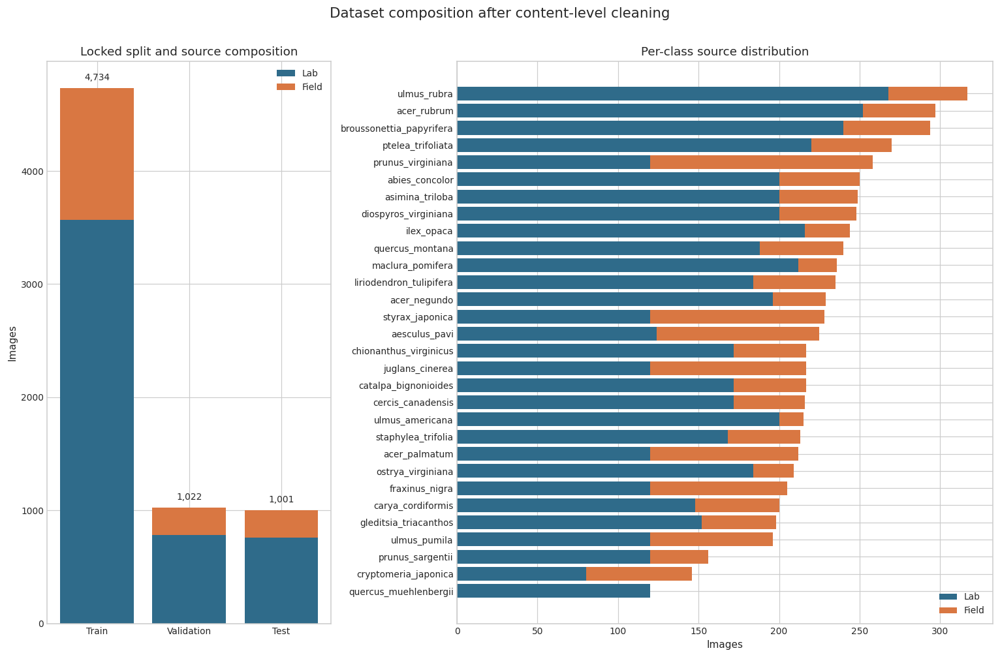

In [4]:
plot_splits = split_summary[split_summary["split"] != "all"].copy()
plot_splits["split"] = plot_splits["split"].replace({"validation": "Validation", "train": "Train", "test": "Test"})
ordered_classes = class_summary.sort_values("total", ascending=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 9), gridspec_kw={"width_ratios": [0.9, 1.7]})

axes[0].bar(plot_splits["split"], plot_splits["lab_images"], label="Lab", color=BLUE)
axes[0].bar(
    plot_splits["split"],
    plot_splits["field_images"],
    bottom=plot_splits["lab_images"],
    label="Field",
    color=ORANGE,
)
axes[0].set_title("Locked split and source composition")
axes[0].set_ylabel("Images")
axes[0].legend(frameon=False)
for idx, row in plot_splits.reset_index(drop=True).iterrows():
    axes[0].text(idx, row["total_images"] + 70, f"{row['total_images']:,}", ha="center")

axes[1].barh(ordered_classes["label"], ordered_classes["lab"], label="Lab", color=BLUE)
axes[1].barh(
    ordered_classes["label"],
    ordered_classes["field"],
    left=ordered_classes["lab"],
    label="Field",
    color=ORANGE,
)
axes[1].set_title("Per-class source distribution")
axes[1].set_xlabel("Images")
axes[1].legend(frameon=False, loc="lower right")

fig.suptitle("Dataset composition after content-level cleaning", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

min_row = class_summary.loc[class_summary["total"].idxmin()]
max_row = class_summary.loc[class_summary["total"].idxmax()]
print(
    f"Smallest class: {min_row['label']} ({int(min_row['total'])} images). "
    f"Largest class: {max_row['label']} ({int(max_row['total'])} images). "
    f"Max/min ratio: {max_row['total'] / min_row['total']:.2f}."
)

### 2.2 Representative source images

The examples below come from the supplied Leafsnap archive. They illustrate the domain gap. Lab
images isolate a pressed leaf, while field images contain natural background and lighting
variation. They are shown for context only; this section does not use them to regenerate the
locked split.

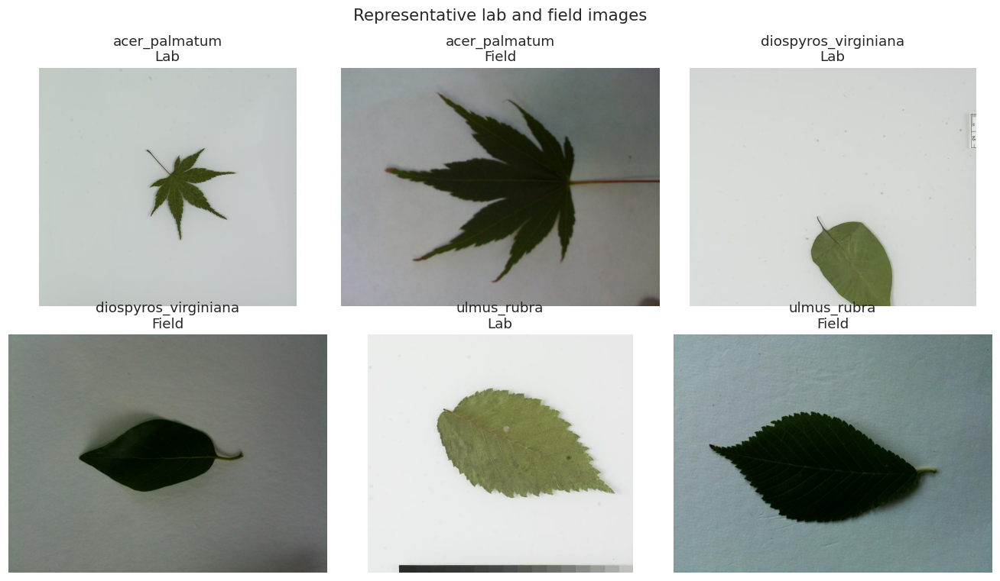

In [5]:
example_dir = ROOT / "notebook_assets/examples"
examples = [
    ("acer_palmatum", "Lab", "wb1127-01-1.jpg"),
    ("acer_palmatum", "Field", "1249061360_0000.jpg"),
    ("diospyros_virginiana", "Lab", "pi0196-01-1.jpg"),
    ("diospyros_virginiana", "Field", "12991999785260.jpg"),
    ("ulmus_rubra", "Lab", "pi1077-01-1.jpg"),
    ("ulmus_rubra", "Field", "13002228280378.jpg"),
]

if all((example_dir / filename).exists() for _, _, filename in examples):
    fig, axes = plt.subplots(2, 3, figsize=(12, 7))
    for axis, (species, source, filename) in zip(axes.flat, examples):
        image = Image.open(example_dir / filename).convert("RGB")
        axis.imshow(image)
        axis.set_title(f"{species}\n{source}")
        axis.axis("off")
    fig.suptitle("Representative lab and field images", fontsize=14)
    plt.tight_layout()
    plt.show()
else:
    print("Example images are not included in this copy. The recorded analysis below is unaffected.")

### 2.3 Data integrity and remaining challenges

The Part 2 audit confirmed:

- no missing or unreadable images in the locked metadata;
- no path or SHA-256 overlap across train, validation, and test;
- no remaining cross-class exact-content conflict;
- one unique content hash for each final sample;
- contiguous class indices 0–29;
- all 30 classes in every split.

Exact hashes cannot detect every visually near-duplicate leaf. Filename grouping covers known
multiple-shot naming patterns, but unrelated filenames may still depict similar physical leaves.
This remains a limitation.

## 3. Preprocessing

All inputs become RGB tensors with shape `[3, 224, 224]`. ImageNet mean and standard deviation are
used because the backbone starts from ImageNet weights.

| Stage | Training | Validation and test |
|---|---|---|
| Initial fit | Contain within 248×248 | Contain within 224×224 |
| Background | White square padding | White square padding |
| Spatial step | Random 224×224 crop | Deterministic 224×224 resize |
| Flip | Horizontal, probability 0.5 | None |
| Brightness | Probability 0.35, factor 0.80–1.20 | None |
| Contrast | Probability 0.35, factor 0.80–1.20 | None |
| Normalization | ImageNet | ImageNet |

The validation and test transforms contain no random crop or augmentation. No test-time
augmentation is used.

In [6]:
normalization = pd.DataFrame(
    {
        "Channel": ["Red", "Green", "Blue"],
        "Mean": [0.485, 0.456, 0.406],
        "Standard deviation": [0.229, 0.224, 0.225],
    }
)
display(normalization)
print("Dataset interface: (image, target) → batch [N, 3, 224, 224], labels [N], torch.int64.")

Dataset interface: (image, target) → batch [N, 3, 224, 224], labels [N], torch.int64.


,Channel,Mean,Standard deviation
0,Red,0.485,0.229
1,Green,0.456,0.224
2,Blue,0.406,0.225


## 4. MobileNetV2 transfer-learning strategy

`torchvision.models.mobilenet_v2` is initialized with ImageNet weights. The final linear layer is
replaced with a 30-output classifier. The implementation keeps the standard `features` and
`classifier` modules for later Grad-CAM work.

Frozen BatchNorm layers remain in evaluation mode during training. Their running statistics do not
change. In Partial mode, BatchNorm in blocks 15–18 trains normally.

In [7]:
frozen_meta = read_json("experiments/frozen/checkpoint_metadata.json")
partial_meta = read_json("experiments/partial/checkpoint_metadata.json")

strategy = pd.DataFrame(
    [
        {
            "Mode": "Frozen",
            "Trainable features": "None",
            "Classifier": "Trainable",
            "Total parameters": frozen_meta["total_parameters"],
            "Trainable parameters": frozen_meta["trainable_parameters"],
            "Frozen parameters": frozen_meta["frozen_parameters"],
            "Feature LR": "—",
            "Classifier LR": "1e-3",
        },
        {
            "Mode": "Partial",
            "Trainable features": "Blocks 15–18",
            "Classifier": "Trainable",
            "Total parameters": partial_meta["total_parameters"],
            "Trainable parameters": partial_meta["trainable_parameters"],
            "Frozen parameters": partial_meta["frozen_parameters"],
            "Feature LR": "1e-5",
            "Classifier LR": "1e-4",
        },
    ]
)
display(strategy)

,Mode,Trainable features,Classifier,Total parameters,Trainable parameters,Frozen parameters,Feature LR,Classifier LR
0,Frozen,None,Trainable,2262302,38430,2223872,—,1e-3
1,Partial,Blocks 15–18,Trainable,2262302,1564510,697792,1e-5,1e-4


### 4.1 Experimental setup

Shared settings:

- input size 224×224;
- batch size 32;
- maximum 15 epochs;
- cross-entropy loss;
- AdamW with weight decay `1e-4`;
- cosine annealing learning-rate schedule;
- mixed precision on CUDA;
- seed 42;
- early-stopping patience 5;
- checkpoint selection by validation Macro-F1.

The Frozen run trains first. Partial fine-tuning then starts from the
validation-selected Frozen epoch-15 checkpoint. The test split is not loaded during either
training run.

In [8]:
frozen_summary = read_json("experiments/frozen/training_summary.json")
partial_summary = read_json("experiments/partial/training_summary.json")

training_setup = pd.DataFrame(
    [
        {
            "Mode": "Frozen",
            "Start": "ImageNet MobileNetV2",
            "Epochs completed": frozen_summary["epochs_completed"],
            "Selected epoch": frozen_summary["best_epoch"],
            "Trainable parameters": frozen_summary["trainable_parameters"],
            "Training time (min)": frozen_summary["elapsed_minutes"],
            "Peak allocated GPU MB": frozen_summary["max_gpu_memory_allocated_mb"],
        },
        {
            "Mode": "Partial",
            "Start": "Frozen epoch 15",
            "Epochs completed": partial_summary["epochs_completed"],
            "Selected epoch": partial_summary["best_epoch"],
            "Trainable parameters": partial_summary["trainable_parameters"],
            "Training time (min)": partial_summary["elapsed_minutes"],
            "Peak allocated GPU MB": partial_summary["max_gpu_memory_allocated_mb"],
        },
    ]
)
display(training_setup.round({"Training time (min)": 2, "Peak allocated GPU MB": 1}))

,Mode,Start,Epochs completed,Selected epoch,Trainable parameters,Training time (min),Peak allocated GPU MB
0,Frozen,ImageNet MobileNetV2,15,15,38430,9.00,307.5
1,Partial,Frozen epoch 15,15,14,1564510,8.72,317.8


## 5. Training dynamics

The curves below are reconstructed from the saved histories. Dashed vertical lines mark the epoch
selected by validation Macro-F1. Test results do not affect these choices.

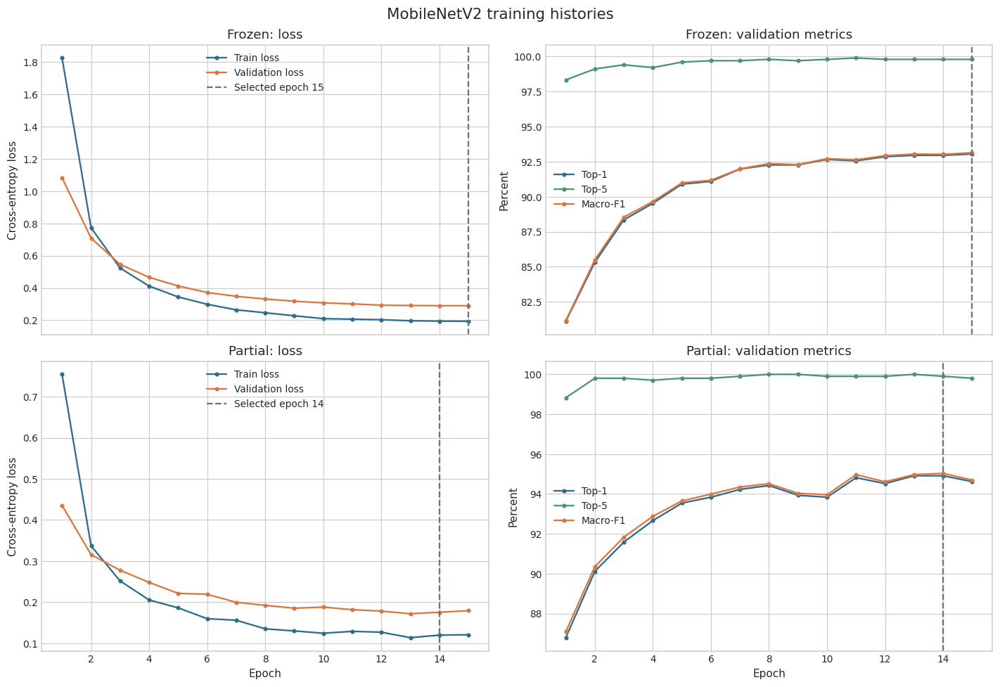

In [9]:
histories = {
    "Frozen": pd.read_csv(ROOT / "experiments/frozen/history.csv"),
    "Partial": pd.read_csv(ROOT / "experiments/partial/history.csv"),
}
selected_epochs = {"Frozen": 15, "Partial": 14}

fig, axes = plt.subplots(2, 2, figsize=(13, 9), sharex="col")
for row, (name, history) in enumerate(histories.items()):
    selected = selected_epochs[name]

    axes[row, 0].plot(history["epoch"], history["train_loss"], marker="o", ms=3, label="Train loss", color=BLUE)
    axes[row, 0].plot(history["epoch"], history["val_loss"], marker="o", ms=3, label="Validation loss", color=ORANGE)
    axes[row, 0].axvline(selected, color=GREY, linestyle="--", label=f"Selected epoch {selected}")
    axes[row, 0].set_title(f"{name}: loss")
    axes[row, 0].set_ylabel("Cross-entropy loss")
    axes[row, 0].legend(frameon=False)

    axes[row, 1].plot(history["epoch"], 100 * history["val_top1"], marker="o", ms=3, label="Top-1", color=BLUE)
    axes[row, 1].plot(history["epoch"], 100 * history["val_top5"], marker="o", ms=3, label="Top-5", color=GREEN)
    axes[row, 1].plot(
        history["epoch"],
        100 * history["val_macro_f1"],
        marker="o",
        ms=3,
        label="Macro-F1",
        color=ORANGE,
    )
    axes[row, 1].axvline(selected, color=GREY, linestyle="--")
    axes[row, 1].set_title(f"{name}: validation metrics")
    axes[row, 1].set_ylabel("Percent")
    axes[row, 1].legend(frameon=False)

for axis in axes[-1]:
    axis.set_xlabel("Epoch")

fig.suptitle("MobileNetV2 training histories", fontsize=14)
plt.tight_layout()
plt.show()

### Training observations

- Frozen improves steadily and selects the final epoch, 15.
- Partial improves faster because it starts from the trained Frozen checkpoint.
- Partial reaches its minimum validation loss at epoch 13.
- Epoch 14 has the highest validation Macro-F1, so epoch 14 is the locked Partial checkpoint.
- All metrics in each results row come from the same selected epoch. Values from different epochs
  are not mixed.

## 6. Validation and final locked test results

In [10]:
results_raw = pd.read_csv(ROOT / "notebook_results_tables.csv")
results = results_raw[results_raw["row_type"] == "model"].copy()
results["model"] = results["model"].replace({"Frozen": "MobileNetV2 Frozen", "Partial": "MobileNetV2 Partial"})

result_table = pd.DataFrame(
    {
        "Model": results["model"],
        "Selected epoch": results["validation_selected_epoch"].astype(int),
        "Val loss": results["val_loss"].map(lambda x: f"{x:.4f}"),
        "Val Top-1": results["val_top1_percent"].map(lambda x: f"{x:.2f}%"),
        "Val Top-5": results["val_top5_percent"].map(lambda x: f"{x:.2f}%"),
        "Val Macro-F1": results["val_macro_f1_percent"].map(lambda x: f"{x:.2f}%"),
        "Test loss": results["test_loss"].map(lambda x: f"{x:.4f}"),
        "Test Top-1": results["test_top1_percent"].map(lambda x: f"{x:.2f}%"),
        "Test Top-5": results["test_top5_percent"].map(lambda x: f"{x:.2f}%"),
        "Test Macro-F1": results["test_macro_f1_percent"].map(lambda x: f"{x:.2f}%"),
    }
)
display(result_table)

,Model,Selected epoch,Val loss,Val Top-1,Val Top-5,Val Macro-F1,Test loss,Test Top-1,Test Top-5,Test Macro-F1
0,MobileNetV2 Frozen,15,0.2898,93.05%,99.80%,93.14%,0.2869,92.61%,99.80%,93.10%
1,MobileNetV2 Partial,14,0.1754,94.91%,99.90%,95.03%,0.1895,93.81%,100.00%,93.99%


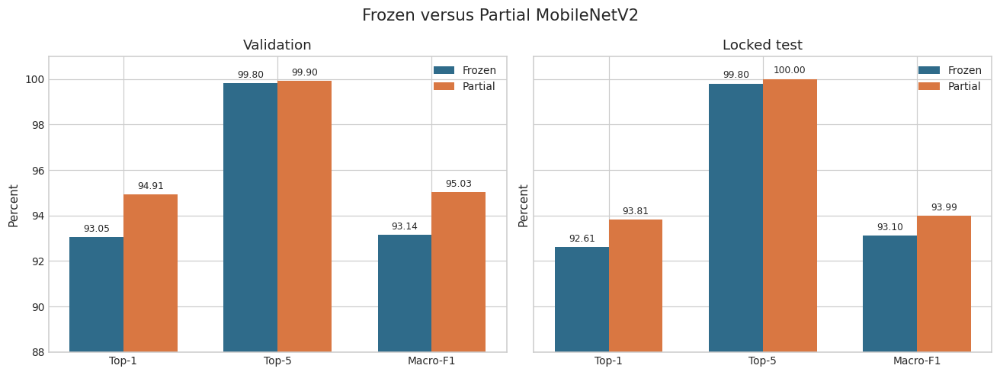

In [11]:
metric_labels = ["Top-1", "Top-5", "Macro-F1"]
frozen_row = results.iloc[0]
partial_row = results.iloc[1]

validation_frozen = [
    frozen_row["val_top1_percent"],
    frozen_row["val_top5_percent"],
    frozen_row["val_macro_f1_percent"],
]
validation_partial = [
    partial_row["val_top1_percent"],
    partial_row["val_top5_percent"],
    partial_row["val_macro_f1_percent"],
]
test_frozen = [
    frozen_row["test_top1_percent"],
    frozen_row["test_top5_percent"],
    frozen_row["test_macro_f1_percent"],
]
test_partial = [
    partial_row["test_top1_percent"],
    partial_row["test_top5_percent"],
    partial_row["test_macro_f1_percent"],
]

x = np.arange(len(metric_labels))
width = 0.35
fig, axes = plt.subplots(1, 2, figsize=(12, 4.5), sharey=True)
for axis, title, frozen_values, partial_values in [
    (axes[0], "Validation", validation_frozen, validation_partial),
    (axes[1], "Locked test", test_frozen, test_partial),
]:
    axis.bar(x - width / 2, frozen_values, width, label="Frozen", color=BLUE)
    axis.bar(x + width / 2, partial_values, width, label="Partial", color=ORANGE)
    axis.set_xticks(x, metric_labels)
    axis.set_ylim(88, 101)
    axis.set_title(title)
    axis.set_ylabel("Percent")
    axis.legend(frameon=False)
    for position, values in [(x - width / 2, frozen_values), (x + width / 2, partial_values)]:
        for px, value in zip(position, values):
            axis.text(px, value + 0.25, f"{value:.2f}", ha="center", fontsize=8)

fig.suptitle("Frozen versus Partial MobileNetV2", fontsize=14)
plt.tight_layout()
plt.show()

### 6.1 Locked evaluation protocol

1. Both checkpoints were selected before test access.
2. Selection used validation Macro-F1 only.
3. Frozen epoch 15 and Partial epoch 14 were locked.
4. Each checkpoint was evaluated once on the 1,001-image test split.
5. Test preprocessing was deterministic and used `shuffle=False`.
6. No random crop, test-time augmentation, or ensemble was used.
7. No training occurred after test evaluation.

Partial improves test Top-1 by **1.20 percentage points** and test Macro-F1 by **0.89 points**.
Test loss falls from 0.2869 to 0.1895. Top-5 is already near saturation for Frozen, so Top-1 and
Macro-F1 provide the more useful comparison.

## 7. Per-class and confusion analysis

Rows are true classes and columns are predicted classes. Both matrices are dominated by the
diagonal. Errors are concentrated in a small number of class pairs.

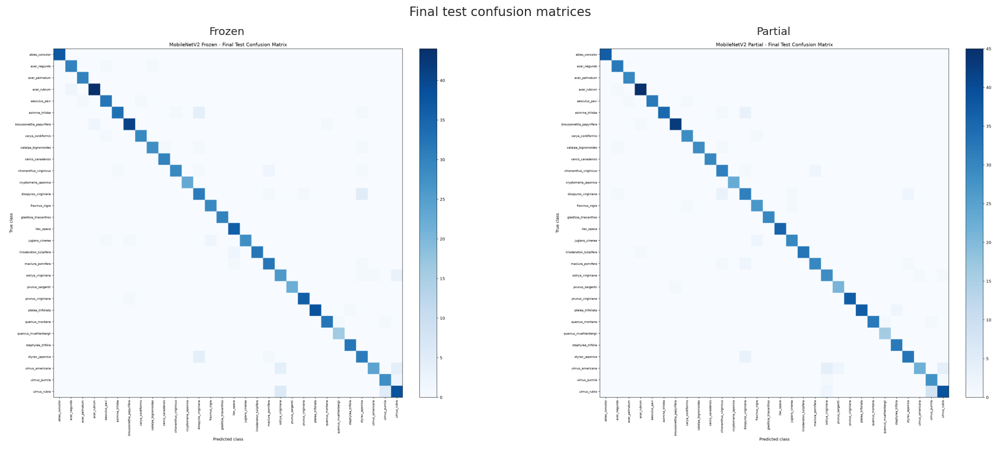

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(17, 7))
for axis, name, relative_path in [
    (axes[0], "Frozen", "final_test/frozen_confusion_matrix.png"),
    (axes[1], "Partial", "final_test/partial_confusion_matrix.png"),
]:
    image = Image.open(ROOT / relative_path)
    axis.imshow(image)
    axis.set_title(name)
    axis.axis("off")
fig.suptitle("Final test confusion matrices", fontsize=14)
plt.tight_layout()
plt.show()

,Model,Class,Precision,Recall,F1,Support
0,Frozen,ostrya_virginiana,72.22%,83.87%,77.61%,31
1,Frozen,diospyros_virginiana,75.61%,81.58%,78.48%,38
2,Frozen,ulmus_rubra,80.85%,77.55%,79.17%,49
3,Frozen,styrax_japonica,75.61%,86.11%,80.52%,36
4,Frozen,ulmus_americana,96.00%,75.00%,84.21%,32
5,Partial,diospyros_virginiana,77.50%,81.58%,79.49%,38
6,Partial,ulmus_americana,95.65%,68.75%,80.00%,32
7,Partial,ulmus_rubra,86.67%,79.59%,82.98%,49
8,Partial,ulmus_pumila,75.68%,93.33%,83.58%,30
9,Partial,ostrya_virginiana,80.56%,93.55%,86.57%,31


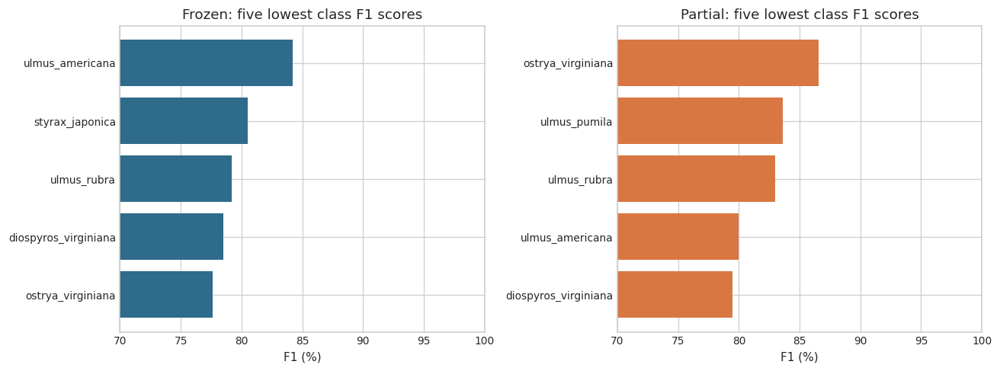

In [13]:
weakest_frames = []
for name in ["frozen", "partial"]:
    report = pd.read_csv(ROOT / f"final_test/{name}_classification_report.csv")
    weakest = report.nsmallest(5, "f1").copy()
    weakest.insert(0, "model", name.title())
    weakest_frames.append(weakest)

weakest_classes = pd.concat(weakest_frames, ignore_index=True)
weakest_display = weakest_classes.copy()
for column in ["precision", "recall", "f1"]:
    weakest_display[column] = weakest_display[column].map(lambda x: f"{100 * x:.2f}%")
display(
    weakest_display[
        ["model", "class_name", "precision", "recall", "f1", "support"]
    ].rename(
        columns={
            "model": "Model",
            "class_name": "Class",
            "precision": "Precision",
            "recall": "Recall",
            "f1": "F1",
            "support": "Support",
        }
    )
)

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5), sharex=True)
for axis, name, frame, color in zip(axes, ["Frozen", "Partial"], weakest_frames, [BLUE, ORANGE]):
    plot_frame = frame.sort_values("f1")
    axis.barh(plot_frame["class_name"], 100 * plot_frame["f1"], color=color)
    axis.set_title(f"{name}: five lowest class F1 scores")
    axis.set_xlabel("F1 (%)")
    axis.set_xlim(70, 100)
plt.tight_layout()
plt.show()

In [14]:
final_summary = read_json("final_test/final_test_summary.json")
pair_rows = []
for model_name in ["frozen", "partial"]:
    pairs = final_summary["models"][model_name]["strongest_confusion_pairs"][:3]
    for pair in pairs:
        pair_rows.append(
            {
                "Model": model_name.title(),
                "Class A": pair["class_a"],
                "Class B": pair["class_b"],
                "A → B": pair["a_predicted_as_b"],
                "B → A": pair["b_predicted_as_a"],
                "Total": pair["total_confusions"],
            }
        )
display(pd.DataFrame(pair_rows))

,Model,Class A,Class B,A → B,B → A,Total
0,Frozen,diospyros_virginiana,styrax_japonica,5,4,9
1,Frozen,ostrya_virginiana,ulmus_rubra,3,6,9
2,Frozen,ulmus_pumila,ulmus_rubra,2,5,7
3,Partial,ulmus_pumila,ulmus_rubra,1,8,9
4,Partial,diospyros_virginiana,styrax_japonica,2,3,5
5,Partial,ostrya_virginiana,ulmus_americana,1,4,5


The largest Partial confusion is `ulmus_pumila` versus `ulmus_rubra`, with nine errors in total.
`diospyros_virginiana` versus `styrax_japonica` remains a repeated confusion pair, but falls from
nine Frozen errors to five Partial errors.

These counts identify where errors occur. They do not establish the cause. Image-level review is
needed before attributing an error to morphology, illumination, occlusion, or label quality.

### 7.1 Lab versus field observations

,Model,Source,Images,Top-1 (%),Macro-F1 (%)
0,Frozen,Lab,760,93.03,93.49
1,Frozen,Field,241,91.29,90.06
2,Partial,Lab,760,93.03,93.01
3,Partial,Field,241,96.27,96.44


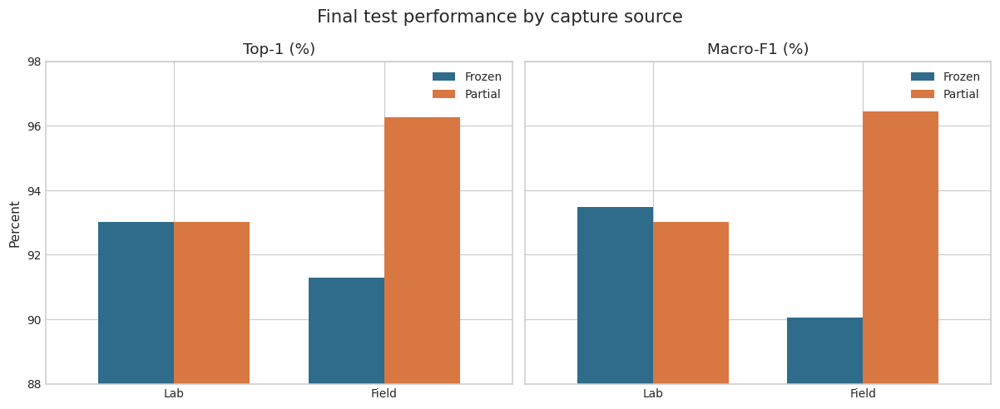

In [15]:
source_rows = []
for model_name in ["frozen", "partial"]:
    for source_name in ["lab", "field"]:
        metrics = final_summary["models"][model_name]["source_metrics"][source_name]
        source_rows.append(
            {
                "Model": model_name.title(),
                "Source": source_name.title(),
                "Images": metrics["images"],
                "Top-1 (%)": 100 * metrics["top1"],
                "Macro-F1 (%)": 100 * metrics["macro_f1"],
            }
        )
source_results = pd.DataFrame(source_rows)
display(source_results.round({"Top-1 (%)": 2, "Macro-F1 (%)": 2}))

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5), sharey=True)
for axis, metric in zip(axes, ["Top-1 (%)", "Macro-F1 (%)"]):
    pivot = source_results.pivot(index="Source", columns="Model", values=metric).loc[["Lab", "Field"]]
    pivot.plot(kind="bar", ax=axis, color=[BLUE, ORANGE], width=0.72)
    axis.set_title(metric)
    axis.set_xlabel("")
    axis.set_ylabel("Percent")
    axis.set_ylim(88, 98)
    axis.tick_params(axis="x", rotation=0)
    axis.legend(frameon=False)
plt.suptitle("Final test performance by capture source", fontsize=14)
plt.tight_layout()
plt.show()

Partial's observed gain is mainly associated with the field subset:

- field Top-1 rises from 91.29% to 96.27%, a gain of 4.98 points;
- field Macro-F1 rises from 90.06% to 96.44%, a gain of 6.39 points;
- lab Top-1 is unchanged at 93.03%;
- lab Macro-F1 decreases by 0.48 points.

This is descriptive, not a new selection rule. The field test subset has only 241 images and covers
29 classes. `quercus_muehlenbergii` has no field test support. The subset estimates are therefore
more variable than the overall test result.

## 8. Discussion

### Main finding

Partial fine-tuning is the stronger of the two tested MobileNetV2 regimes. The improvement appears
on validation and remains on the locked test set. Updating the last four feature blocks therefore
helps the network adapt beyond fixed ImageNet features.

### Strengths

- The split is content-cleaned and audited for exact path/hash leakage.
- Checkpoint selection uses validation Macro-F1 only.
- Top-1, Top-5, Macro-F1, per-class metrics, confusion matrices, and source metrics are reported.
- The final test policy is fixed and recorded.
- Checkpoints, configurations, histories, hashes, and environment details are preserved.

### Limitations

- Only two transfer-learning regimes were formally evaluated.
- Both runs use one seed, so run-to-run variation is unknown.
- Class and lab/field imbalance remain.
- The field test subset is small and has only 29 represented classes.
- Exact hashes and filename grouping cannot prove the absence of all visually near-duplicate leaves.
- The recorded inference times are not a controlled speed benchmark. Frozen ran first and may
  include warm-up overhead. Both modes have the same inference graph.

### Future work

- repeat the locked experiment across several seeds;
- compare controlled augmentation settings;
- review class-specific errors with Grad-CAM;
- collect more balanced field images, including the missing field class;
- compare additional compact CNNs under the same split and evaluation protocol.

These are recommendations only. They were not run as part of Part 3.

## 9. Reproducibility

The formal runs used Python 3.12.10, PyTorch 2.13.0+cu130, torchvision 0.28.0+cu130, CUDA 13.0,
and an NVIDIA GeForce RTX 4060 Laptop GPU. The random seed was 42. Repository commit:
`9cfe873472752a66e7906a86a5a1958b106a7d8e`.

The next cell verifies the two packaged checkpoint files against the recorded SHA-256 identities.
It does not load the models or access the test set.

In [16]:
def sha256_file(path: Path, chunk_size: int = 1024 * 1024) -> str:
    digest = hashlib.sha256()
    with path.open("rb") as handle:
        for chunk in iter(lambda: handle.read(chunk_size), b""):
            digest.update(chunk)
    return digest.hexdigest()


checkpoint_rows = []
for mode in ["frozen", "partial"]:
    metadata = read_json(f"experiments/{mode}/checkpoint_metadata.json")
    checkpoint_path = ROOT / metadata["package_checkpoint"]
    actual_hash = sha256_file(checkpoint_path)
    checkpoint_rows.append(
        {
            "Checkpoint": mode.title(),
            "Epoch": metadata["checkpoint_epoch"],
            "Selection metric": metadata["selection_metric"],
            "Recorded SHA-256": metadata["sha256"],
            "Actual SHA-256": actual_hash,
            "Match": actual_hash == metadata["sha256"],
        }
    )

checkpoint_verification = pd.DataFrame(checkpoint_rows)
assert checkpoint_verification["Match"].all()
display(checkpoint_verification)

,Checkpoint,Epoch,Selection metric,Recorded SHA-256,Actual SHA-256,Match
0,Frozen,15,val_macro_f1,6c708cc6713f02732da137e9ac4396a939696c285b125b...,6c708cc6713f02732da137e9ac4396a939696c285b125b...,True
1,Partial,14,val_macro_f1,9716e5f311abb5c828539f9ab7963c7444f6caf2cbc004...,9716e5f311abb5c828539f9ab7963c7444f6caf2cbc004...,True


### Optional checkpoint loading

The cell below is disabled by default. It is for later fixed analysis such as Grad-CAM. Set
`LOAD_PARTIAL_MODEL = True` only in the project environment with the recorded PyTorch and
torchvision versions. It uses `pretrained=False` to avoid downloading ImageNet weights, then loads
the complete saved state with `strict=True`.

In [17]:
LOAD_PARTIAL_MODEL = False

if LOAD_PARTIAL_MODEL:
    import torch

    sys.path.insert(0, str(ROOT))
    from src.models.mobilenetv2 import build_mobilenetv2

    checkpoint = torch.load(
        ROOT / "checkpoints/best_mobilenetv2_partial.pt",
        map_location="cpu",
    )
    model = build_mobilenetv2(
        num_classes=30,
        pretrained=False,
        fine_tune_mode="partial",
        unfreeze_blocks=4,
    )
    model.load_state_dict(checkpoint["model_state_dict"], strict=True)
    model.eval()
    assert checkpoint["selection_metric"] == "val_macro_f1"
    assert checkpoint["epoch"] == 14
    print("Partial checkpoint loaded with strict=True.")
else:
    print("Model loading skipped. Saved metrics and visualisations above remain fully reproducible.")

Model loading skipped. Saved metrics and visualisations above remain fully reproducible.


## 10. Implementation Summary

The MobileNetV2 transfer-learning component includes:

- integrated torchvision MobileNetV2 with ImageNet weights and a 30-class classifier;
- implemented Frozen, Partial, and Full parameter-control modes;
- formally evaluated Frozen and Partial;
- initialized Partial from the locked Frozen checkpoint;
- trained blocks 15–18 and the classifier with differential learning rates;
- adapted the shared Trainer to accept an external model while retaining baseline compatibility;
- added validation Top-5, Macro-F1, and validation Macro-F1 checkpoint selection;
- kept frozen BatchNorm layers in evaluation mode;
- produced configurations, histories, checkpoints, summaries, and curves;
- locked both checkpoints before test access and completed the recorded one-time test evaluation;
- produced classification reports, confusion matrices, and fixed class/source analyses.

The experiment reuses the locked dataset, metadata, class mapping, and splits established during
data preparation. These shared inputs keep the Baseline and transfer-learning comparisons consistent.

## References

1. N. Kumar et al. “Leafsnap: A Computer Vision System for Automatic Plant Species
   Identification.” *ECCV*, 2012.
2. M. Sandler et al. “MobileNetV2: Inverted Residuals and Linear Bottlenecks.” *CVPR*, 2018.
3. E. Adetiba et al. “LeafsnapNet: An Experimentally Evolved Deep Learning Model for Recognition
   of Plant Species Based on Leafsnap Image Dataset.” 2021.
4. V. K. Gajjar, A. K. Nambisan, and K. L. Kosbar. “Plant Identification in a
   Combined-Imbalanced Leaf Dataset.” *IEEE Access*, 2022.

**Artifact sources:** locked Part 2 statistics, Part 3 configurations and histories, validation
selected checkpoints, and the final evaluation manifest included with this section.

# 05. Transfer Learning and Final Model Selection

This section documents the isolated `reselection_20260727_run1` workflow for final model selection. ResNet18 and EfficientNet-B0 are trained under the same corrected data protocol, compared using validation metrics, and the selected EfficientNet-B0 checkpoint is evaluated once on the final test split.

Earlier experiment artifacts remain preserved for audit. The tables and figures used here are separately named so the reselection evidence does not overwrite the earlier outputs.

## 1. Research Question and Experimental Scope

**Which ImageNet-pretrained architecture provides the strongest validation performance for 30-class tree-species classification under a controlled, reproducible transfer-learning protocol?**

The model-selection study includes:

- ResNet18 and EfficientNet-B0 model adaptation;
- classifier-only training followed by partial fine-tuning;
- ImageNet normalisation and shared data integration;
- staged checkpoint loading and frozen BatchNorm handling;
- MPS-compatible training and evaluation;
- validation-based architecture selection;
- one locked final-test evaluation after selecting the model;
- tables, figures, documentation, and notebook material.

In [ ]:
import csv
import json
from pathlib import Path

ROOT = Path.cwd()
if ROOT.name == "notebooks":
    ROOT = ROOT.parent

TABLE_DIR = ROOT / "report/tables"
FIGURE_DIR = ROOT / "report/figures/reselection_20260727_run1"
RUN_ROOT = ROOT / "reselection_20260727_run1"

required_files = [
    TABLE_DIR / "reselection_resnet18_experiments.csv",
    TABLE_DIR / "reselection_efficientnet_b0_experiments.csv",
    TABLE_DIR / "reselection_model_validation_comparison.csv",
    TABLE_DIR / "reselection_efficientnet_b0_final_test_metrics.csv",
    TABLE_DIR / "reselection_efficientnet_b0_test_per_class_metrics.csv",
]
for path in required_files:
    assert path.is_file(), f"Missing required result: {path}"

print(f"Project root: {ROOT}")
print("Reselection artifacts are available.")

## 2. Corrected data and preprocessing

| Split | Images |
|---|---:|
| Training | 4,734 |
| Validation | 1,022 |
| Test | 1,001 |
| **Total** | **6,757** |

The corrected Part 2 split contains 30 classes and removes duplicate leakage across splits. Both candidate architectures use the same split files, seed 42, batch size 16, weight decay $10^{-4}$, 224 x 224 RGB inputs, shared training augmentation, and deterministic validation/test preprocessing.

ImageNet channel statistics are used:

$$
\mu=[0.485,0.456,0.406],\qquad
\sigma=[0.229,0.224,0.225].
$$

## 3. Staged transfer-learning strategy

Both architectures use a two-stage procedure:

1. Replace the ImageNet classifier and train only the new 30-class head for 5 epochs at learning rate $10^{-3}$.
2. Load the best frozen-head checkpoint and fine-tune the final feature stage plus classifier for 10 epochs at learning rate $3\times10^{-5}$.

| Model | Total parameters | Fine-tuned parameters | Fine-tuned scope |
|---|---:|---:|---|
| ResNet18 | 11,191,902 | 8,409,118 | Layer4 + classifier |
| EfficientNet-B0 | 4,045,978 | 1,167,822 | Final two feature blocks + classifier |

EfficientNet-B0 has only **36.15%** as many total parameters as ResNet18.

In [ ]:
def read_csv_rows(path):
    with path.open(newline="", encoding="utf-8") as file:
        return list(csv.DictReader(file))

resnet_stages = read_csv_rows(
    TABLE_DIR / "reselection_resnet18_experiments.csv"
)
efficientnet_stages = read_csv_rows(
    TABLE_DIR / "reselection_efficientnet_b0_experiments.csv"
)

for row in [*resnet_stages, *efficientnet_stages]:
    print(
        f"{row['model']:15s} | {row['stage']:24s} | "
        f"best epoch {int(row['best_epoch']):2d} | "
        f"validation accuracy {float(row['val_accuracy']):.2%}"
    )

## 4. Fine-tuning behaviour

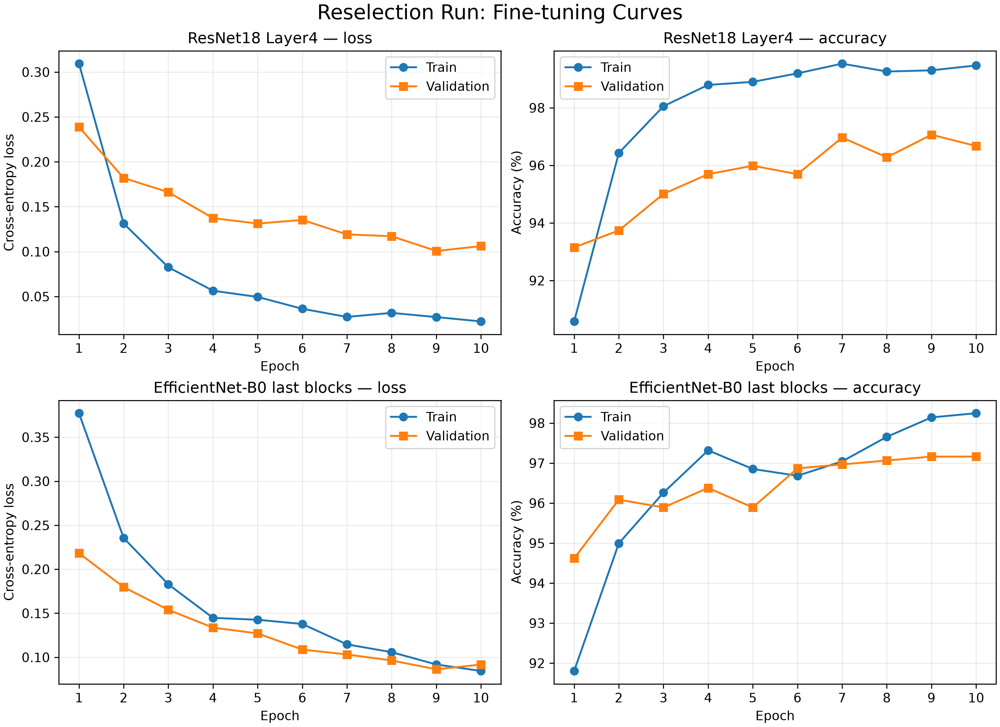

Both fine-tuned models converge to high validation accuracy. ResNet18 reaches its best validation accuracy at epoch 9, with a visible training-validation gap that suggests mild overfitting. EfficientNet-B0 also reaches its first best validation accuracy at epoch 9; its validation loss is lowest at the same epoch and rises slightly at epoch 10.

The saved checkpoint rule uses validation accuracy. When accuracy ties, the earlier saved checkpoint remains selected.

## 5. Validation-based architecture selection

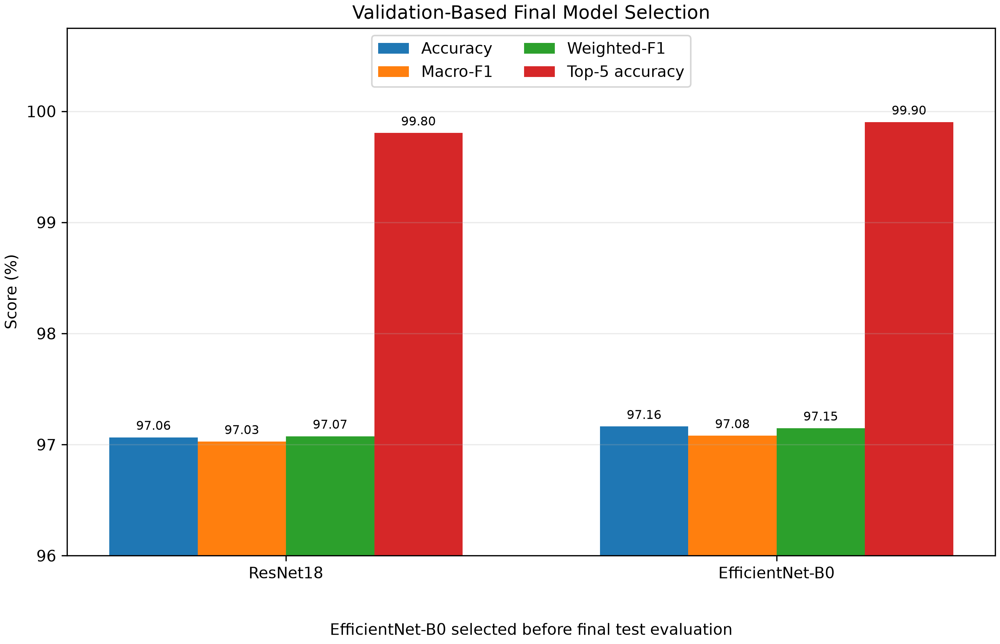

| Model | Accuracy | Macro-F1 | Weighted-F1 | Top-5 accuracy | Parameters |
|---|---:|---:|---:|---:|---:|
| ResNet18 | 97.06% | 97.03% | 97.07% | 99.80% | 11.19M |
| EfficientNet-B0 | **97.16%** | **97.08%** | **97.15%** | **99.90%** | **4.05M** |

EfficientNet-B0 is selected before final test evaluation because it leads on all reported validation metrics and is substantially smaller. The 0.10 percentage-point accuracy difference is descriptive and is not evidence of statistical significance.

In [ ]:
comparison = read_csv_rows(
    TABLE_DIR / "reselection_model_validation_comparison.csv"
)

selected = next(
    row for row in comparison if row["selected_final_model"] == "True"
)
assert selected["model"] == "EfficientNet-B0"

for row in comparison:
    print(
        f"{row['model']:15s} | "
        f"accuracy={float(row['val_accuracy']):.4%} | "
        f"Macro-F1={float(row['val_macro_f1']):.4%} | "
        f"parameters={int(row['total_parameters']):,}"
    )

print(f"Selected final model: {selected['model']}")

## 6. Locked final test result

After model selection was fixed, the EfficientNet-B0 checkpoint was evaluated once on the 1,001-image final test split. No architecture, checkpoint, or hyperparameter was changed after observing the test result.

| Metric | Score |
|---|---:|
| Accuracy | **97.80%** |
| Macro Precision | 98.01% |
| Macro Recall | 97.97% |
| Macro-F1 | **97.94%** |
| Weighted-F1 | **97.81%** |
| Top-5 Accuracy | 99.90% |

The model correctly classifies **979 of 1,001** test images.

In [ ]:
test_metrics = read_csv_rows(
    TABLE_DIR / "reselection_efficientnet_b0_final_test_metrics.csv"
)[0]

assert test_metrics["split"] == "test"
assert test_metrics["evaluation_scope"] == "final_test"
assert test_metrics["test_set_evaluated"] == "True"

for metric in [
    "accuracy",
    "macro_precision",
    "macro_recall",
    "macro_f1",
    "weighted_f1",
    "top5_accuracy",
]:
    print(f"{metric:20s}: {float(test_metrics[metric]):.4%}")

## 7. Per-class test analysis

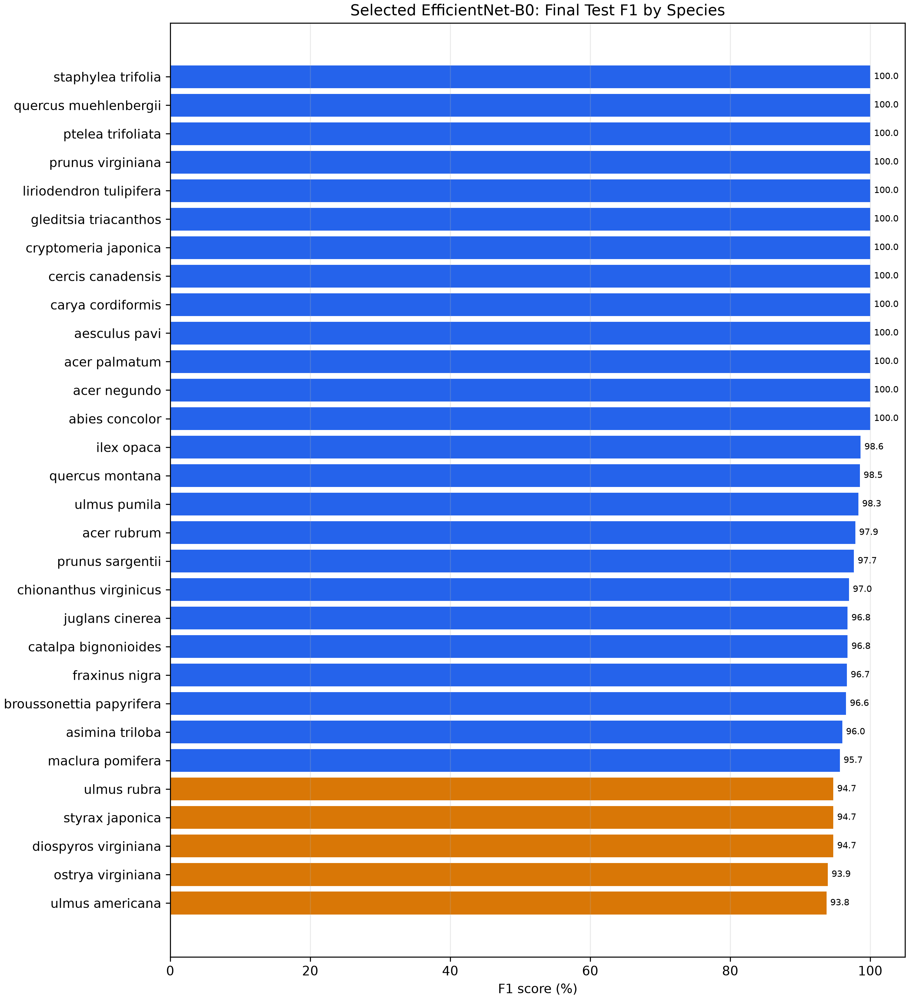

The five lowest-F1 species are `ulmus_americana`, `ostrya_virginiana`, `diospyros_virginiana`, `styrax_japonica`, and `ulmus_rubra`. Even the lowest class F1 is 93.75%, indicating that errors are not concentrated in a severely failing class.

`ostrya_virginiana` and `styrax_japonica` have perfect recall but lower precision. `ulmus_rubra` has high precision but lower recall. These patterns identify useful targets for the group's confusion-matrix and explainability analysis.

In [ ]:
per_class = read_csv_rows(
    TABLE_DIR / "reselection_efficientnet_b0_test_per_class_metrics.csv"
)
lowest_five = sorted(per_class, key=lambda row: float(row["f1"]))[:5]

for row in lowest_five:
    print(
        f"{row['class_name']:26s} | "
        f"precision={float(row['precision']):.2%} | "
        f"recall={float(row['recall']):.2%} | "
        f"F1={float(row['f1']):.2%} | "
        f"support={int(row['support'])}"
    )

## 8. Interpretation and limitations

The reselection experiment supports three conclusions:

1. Partial fine-tuning is important for both architectures.
2. EfficientNet-B0 matches or slightly exceeds ResNet18 validation performance with far fewer parameters.
3. The validation-selected EfficientNet-B0 generalises strongly to the locked test split.

The experiment also has limitations:

- only one corrected split and one seed are used;
- the validation difference is small;
- no confidence interval or statistical significance test is reported;
- runtime and energy use were not measured consistently;
- laboratory and field performance are not separated;
- the final test set cannot be reused for further tuning.

## 9. Reproducibility

Run the isolated training stages in this order:

```bash
python part4_resnet18.py \
  --config reselection_20260727_run1/configs/resnet18_frozen.yaml

python part4_resnet18.py \
  --config reselection_20260727_run1/configs/resnet18_layer4.yaml

python part4_efficientnet_b0.py \
  --config reselection_20260727_run1/configs/efficientnet_b0_frozen.yaml

python part4_efficientnet_b0.py \
  --config reselection_20260727_run1/configs/efficientnet_b0_finetune.yaml
```

Validation evaluation remains the default. The final test command requires the explicit `--split test` argument and is recorded only for provenance.

Regenerate tracked reselection tables and figures without training or evaluation:

```bash
python part4_plot_reselection_results.py
```

## 10. Conclusion

Under the controlled reselection protocol, fine-tuned EfficientNet-B0 achieves **97.16% validation accuracy** and is selected ahead of ResNet18's **97.06%**. The locked EfficientNet-B0 checkpoint then achieves **97.80% final-test accuracy** and **97.94% test Macro-F1**.

EfficientNet-B0 is therefore the final Part 4 model: it provides the strongest reported validation result, excellent held-out performance, and a substantially smaller parameter footprint.

# 06. Evaluation and Explainability

This section presents the final post-selection evaluation of the locked
Baseline Custom CNN, MobileNetV2, and EfficientNet-B0. All models use the same
corrected 30-class Leafsnap subset and 1,001-image test split. No test result is
used for training, tuning, or model selection.

## 1. Setup

The analysis reads immutable checkpoints, saved per-image predictions, and the
shared class mapping. Generated outputs are stored under `outputs/comparison/`,
with report-ready copies under `reports/`. Checkpoint hashes identify the exact
models evaluated.

In [1]:
import json
import sys
from pathlib import Path

import torch
from IPython.display import Image as NotebookImage, display

REPO_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src.evaluation.confusion import strongest_confusion_pairs
from src.evaluation.error_analysis import low_confidence_correct, top_errors
from src.evaluation.metrics import classification_metrics_from_logits, metrics_by_source

OUTPUT_ROOT = REPO_ROOT / "outputs"
COMPARISON_DIR = OUTPUT_ROOT / "comparison"
COMPARISON_DIR.mkdir(parents=True, exist_ok=True)
print(f"Repository: {REPO_ROOT}")


Repository: /Users/charleslee/Documents/GitHub/COMP9444-Tree-Species-Classification


## 2. Locked Evaluation Inputs

The corrected dataset contains 6,757 images: 4,734 train, 1,022 validation,
and 1,001 test. The test split has 760 laboratory and 241 field images. All
three handoffs use the same ordered paths and contiguous 30-class mapping.
EfficientNet-B0 was selected over ResNet18 using validation results before the
final test evaluation.

In [2]:
expected_inputs = {
    "baseline": OUTPUT_ROOT / "baseline",
    "mobilenetv2": OUTPUT_ROOT / "mobilenetv2",
    "efficientnet_b0": OUTPUT_ROOT / "efficientnet_b0",
}

for model_name, model_dir in expected_inputs.items():
    checkpoints = sorted(model_dir.rglob("*.pt")) if model_dir.exists() else []
    print(f"{model_name}: {len(checkpoints)} checkpoint(s)")
    for checkpoint in checkpoints:
        print(f"  {checkpoint.relative_to(REPO_ROOT)}")

baseline: 1 checkpoint(s)
  outputs/baseline/member5_handoff/best_custom_cnn.pt
mobilenetv2: 1 checkpoint(s)
  outputs/mobilenetv2/member5_handoff/checkpoint/best_mobilenetv2_partial.pt
efficientnet_b0: 1 checkpoint(s)
  outputs/efficientnet_b0/member5_handoff/checkpoints/best_model.pt


## 3. Unified Metrics

Accuracy, Macro-F1, Weighted-F1, Top-5 accuracy, per-class metrics, and
lab/field metrics are recomputed from traceable per-image predictions.

**Reporting policy.** Headline test accuracy is 80.52% for the Baseline, 93.81%
for MobileNetV2, and 97.80% for EfficientNet-B0. Detailed Baseline analysis uses
a local prediction file at 80.42%, one image below its owner-reported result.
Brightness and latency are separate local post-hoc experiments.

In [3]:
import csv

summary_paths = sorted(COMPARISON_DIR.glob("*/analysis_summary.json"))
model_summaries = {}
for summary_path in summary_paths:
    summary = json.loads(summary_path.read_text(encoding="utf-8"))
    if summary["model"] in {
        "Baseline-CustomCNN",
        "MobileNetV2-Partial",
        "mobilenetv2_partial",
        "EfficientNet-B0",
    }:
        model_summaries[summary["model"]] = summary

with (COMPARISON_DIR / "model_comparison.csv").open(
    "r", encoding="utf-8", newline=""
) as csv_file:
    comparison_rows = list(csv.DictReader(csv_file))

print(
    f"{'model':<26} {'headline_acc':>14} {'local_acc':>12} "
    f"{'macro_f1':>12} {'weighted_f1':>14} {'top5':>10}"
)
for row in comparison_rows:
    print(
        f"{row['model']:<26} "
        f"{float(row['owner_reported_accuracy']):>14.4f} "
        f"{float(row['accuracy']):>12.4f} "
        f"{float(row['macro_f1']):>12.4f} "
        f"{float(row['weighted_f1']):>14.4f} "
        f"{float(row['top5_accuracy']):>10.4f}"
    )

model                        headline_acc    local_acc     macro_f1    weighted_f1       top5
Baseline-CustomCNN                 0.8052       0.8042       0.8084         0.8009     0.9860
MobileNetV2-Partial                0.9381       0.9381       0.9399         0.9380     1.0000
EfficientNet-B0                    0.9780       0.9780       0.9794         0.9781     0.9990


## 4. Model Comparison

EfficientNet-B0 is the strongest final model: 97.80% Accuracy, 97.94% Macro-F1,
97.81% Weighted-F1, and 99.90% Top-5 accuracy. MobileNetV2 reaches 93.81%
Accuracy and 93.99% Macro-F1; the Baseline headline accuracy is 80.52%.
EfficientNet-B0 was selected before test evaluation because it slightly
outperformed ResNet18 on validation while using 4.05M rather than 11.19M
parameters.

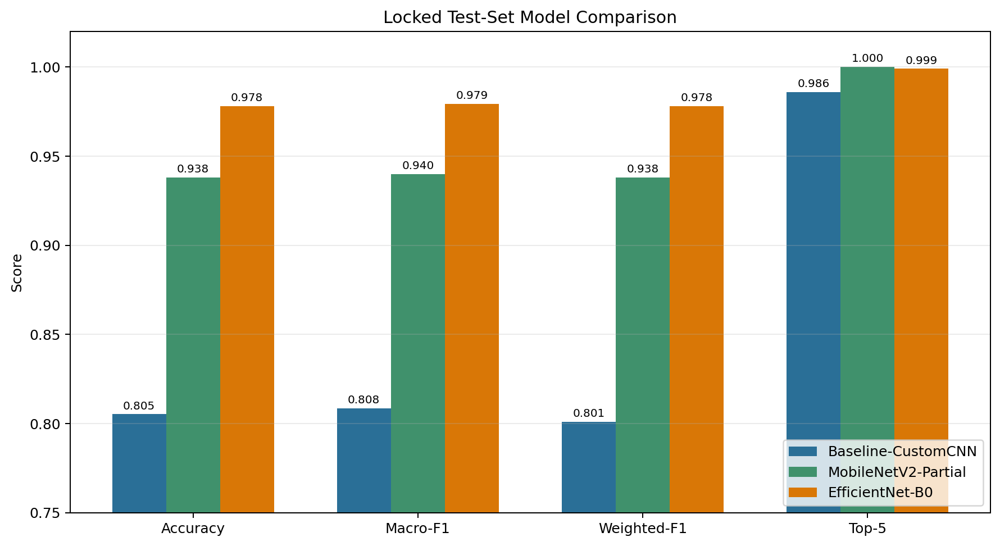

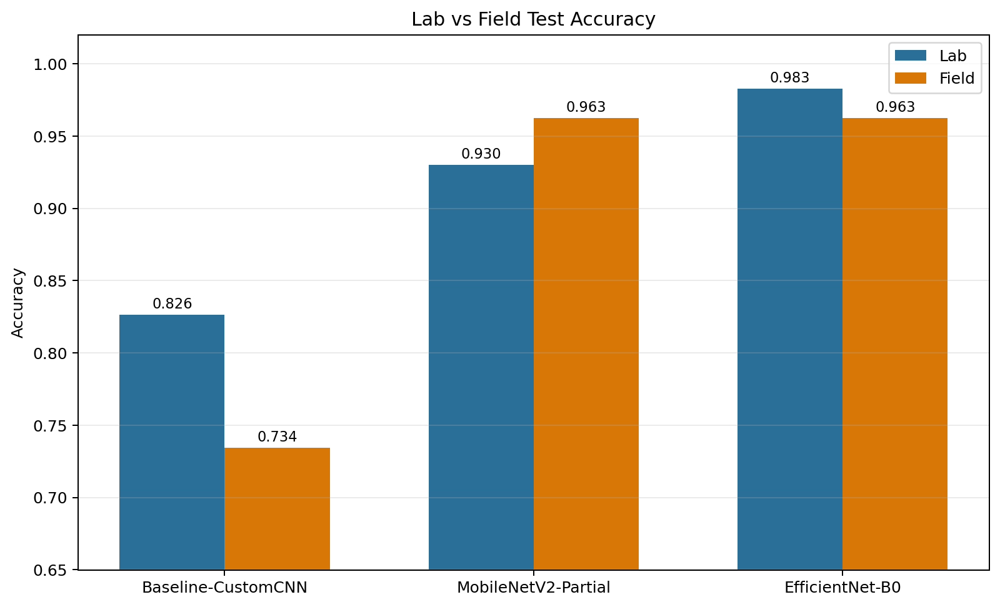

In [4]:
REPORT_FIGURE_DIR = REPO_ROOT / "reports" / "figures"
display(NotebookImage(filename=str(REPORT_FIGURE_DIR / "model_comparison.png")))
display(NotebookImage(filename=str(REPORT_FIGURE_DIR / "source_comparison.png")))

## 5. Confusion Matrix and Per-class Results

EfficientNet-B0 correctly classifies 979 of 1,001 test images. Its weakest
classes are `ulmus_americana` (F1 = 93.75%), `ostrya_virginiana` (93.94%), and
`diospyros_virginiana` (94.74%). Eight class pairs tie at two confusions each,
including several `Ulmus` and `Ostrya` pairs. Errors therefore remain focused
on fine-grained visual similarity rather than broad class failure.

baseline confusion_matrix_normalized.png


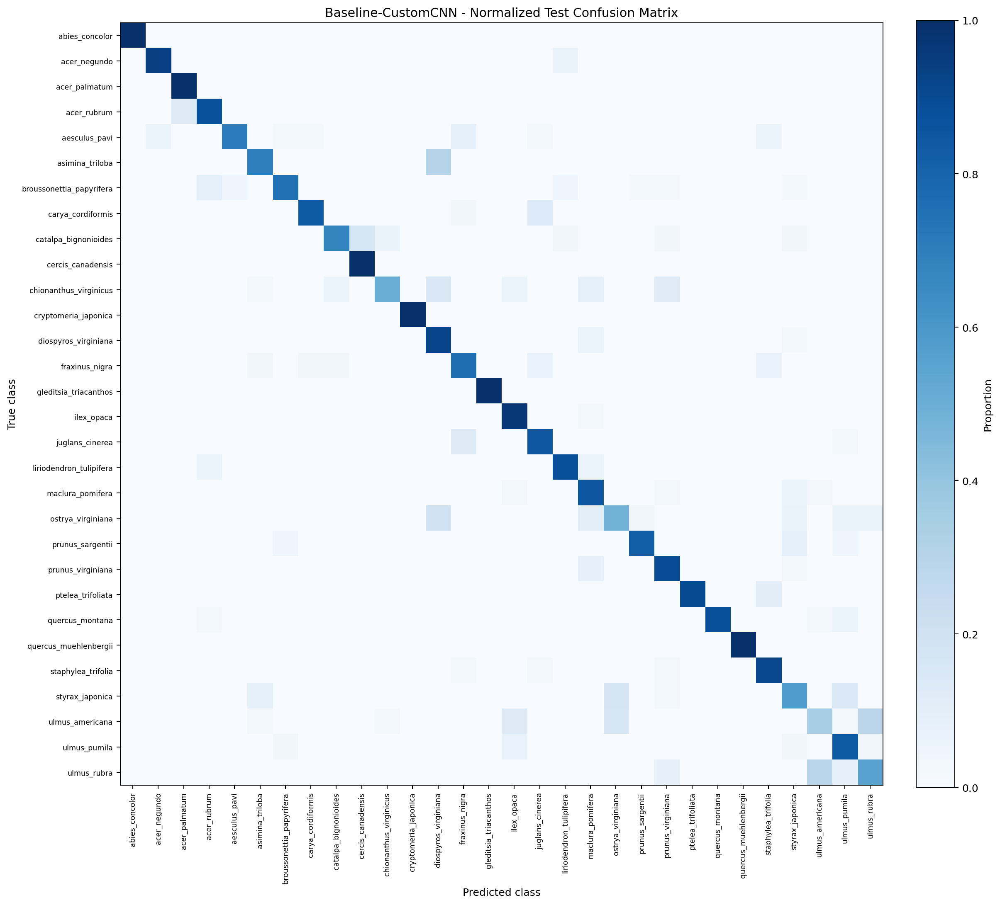

mobilenetv2 confusion_matrix_normalized.png


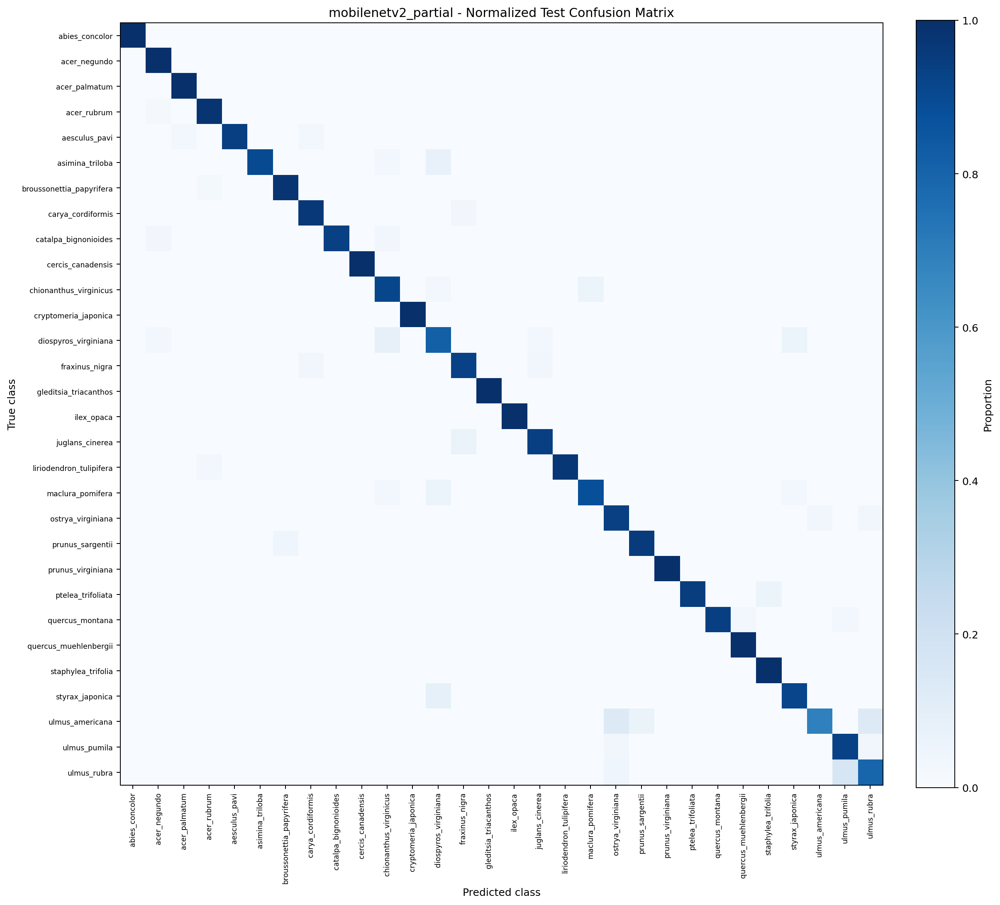

efficientnet_b0 confusion_matrix_normalized.png


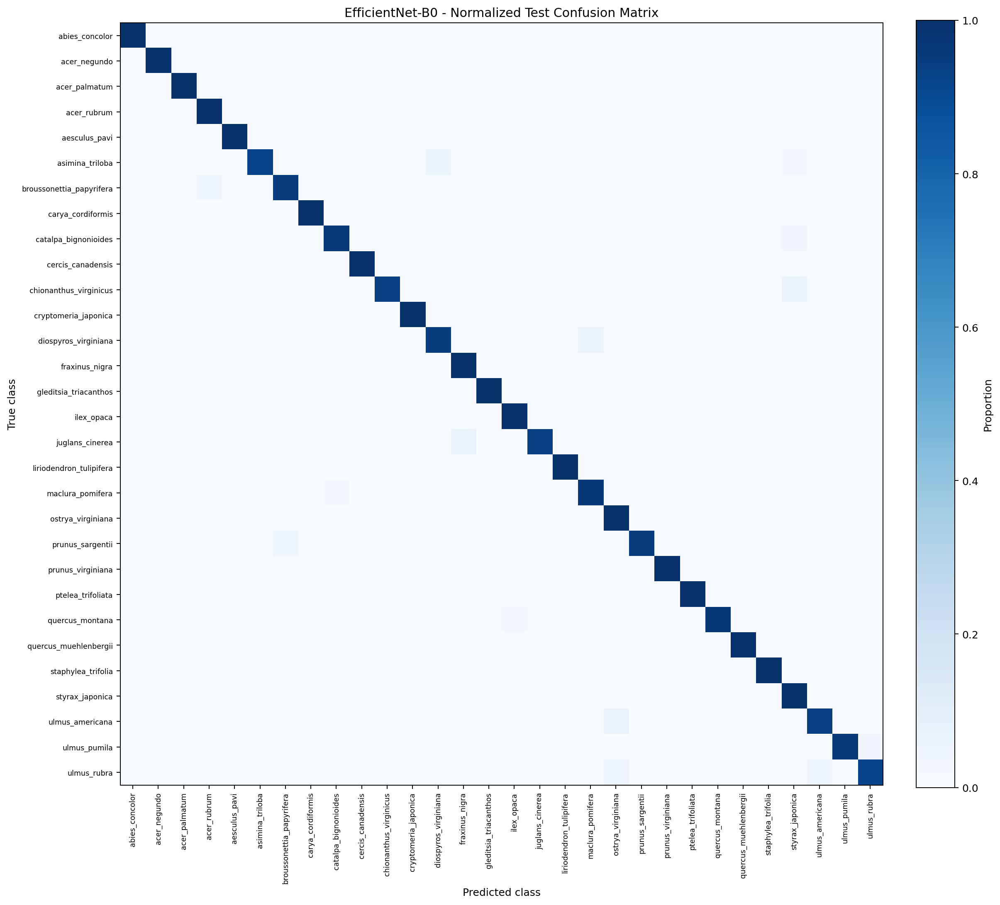

In [5]:
for model_name in (
    "baseline",
    "mobilenetv2",
    "efficientnet_b0",
):
    image_path = COMPARISON_DIR / model_name / "confusion_matrix_normalized.png"
    print(model_name, image_path.name)
    display(NotebookImage(filename=str(image_path), width=800))

## 6. Lab vs Field and Illumination Robustness

The Baseline falls from 82.63% lab accuracy to 73.44% field accuracy, a
9.19-point gap. EfficientNet-B0 records 98.29% lab and 96.27% field accuracy,
a 2.02-point gap. MobileNetV2 records 93.03% lab and 96.27% field accuracy.
The MobileNet field advantage is only an observed subset result: the field set
has 241 images and 29 represented classes, versus 760 lab images and 30 classes.

In [6]:
for model_name, summary in model_summaries.items():
    print(f"\n{model_name}")
    for source, metrics in summary["source_metrics"].items():
        print(
            f"  {source}: images={metrics['num_samples']}, "
            f"accuracy={metrics['accuracy']:.4f}, "
            f"macro_f1={metrics['macro_f1']:.4f}, "
            f"covered_classes={metrics['classes_with_support']}"
        )



Baseline-CustomCNN
  lab: images=760, accuracy=0.8263, macro_f1=0.8263, covered_classes=30
  field: images=241, accuracy=0.7344, macro_f1=0.6920, covered_classes=29

EfficientNet-B0
  lab: images=760, accuracy=0.9829, macro_f1=0.9855, covered_classes=30
  field: images=241, accuracy=0.9627, macro_f1=0.9628, covered_classes=29

mobilenetv2_partial
  lab: images=760, accuracy=0.9303, macro_f1=0.9301, covered_classes=30
  field: images=241, accuracy=0.9627, macro_f1=0.9644, covered_classes=29


## 7. Model Efficiency

Compare parameter count, checkpoint size, batch-one latency, and batch
throughput under one shared CPU protocol. Timings cover the model forward pass
only; they exclude image decoding, preprocessing, and file I/O. Each model
retains its locked deployment input resolution.

model                          params    size_mb    batch1_ms      batch_img_s
Baseline-CustomCNN              1.21M       4.87         6.57           101.48
MobileNetV2-Partial             2.26M       9.30        42.46            30.15
EfficientNet-B0                 4.05M      16.48       424.65            12.44


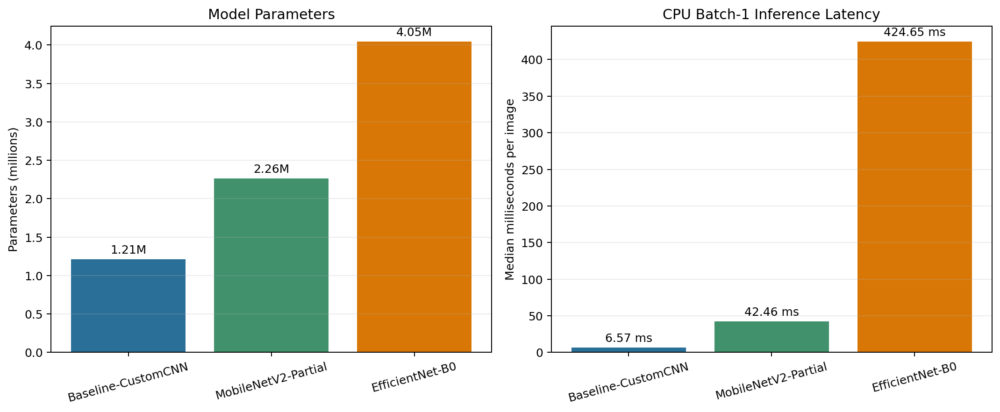

In [7]:
import csv
from IPython.display import Image, display

EXPERIMENT_DIR = COMPARISON_DIR / "experiments"

with (EXPERIMENT_DIR / "model_efficiency.csv").open(
    "r", encoding="utf-8", newline=""
) as csv_file:
    efficiency_rows = list(csv.DictReader(csv_file))

print(
    f"{'model':<26} {'params':>10} {'size_mb':>10} "
    f"{'batch1_ms':>12} {'batch_img_s':>16}"
)
for row in efficiency_rows:
    print(
        f"{row['model']:<26} "
        f"{int(row['total_parameters']) / 1_000_000:>9.2f}M "
        f"{float(row['checkpoint_size_mb']):>10.2f} "
        f"{float(row['batch1_median_latency_ms']):>12.2f} "
        f"{float(row['batch_throughput_images_per_second']):>16.2f}"
    )

display(Image(filename=str(EXPERIMENT_DIR / "model_efficiency.png")))

## 8. Brightness Robustness

Apply deterministic global RGB brightness factors of 0.6, 0.8, 1.0, 1.2,
and 1.4 to every locked test image before the model-specific resize and
normalization. Checkpoints remain frozen. Report changes relative to each
model's local 1.0 run and retain lab/field results. This is a controlled stress
test, not a complete simulation of real-world illumination.

model                          clean   perturbed_mean   worst_factor   max_drop
Baseline-CustomCNN            0.8042           0.6666            0.6     0.3037
MobileNetV2-Partial           0.9381           0.9228            1.4     0.0280
EfficientNet-B0               0.9780           0.9496            1.4     0.0519


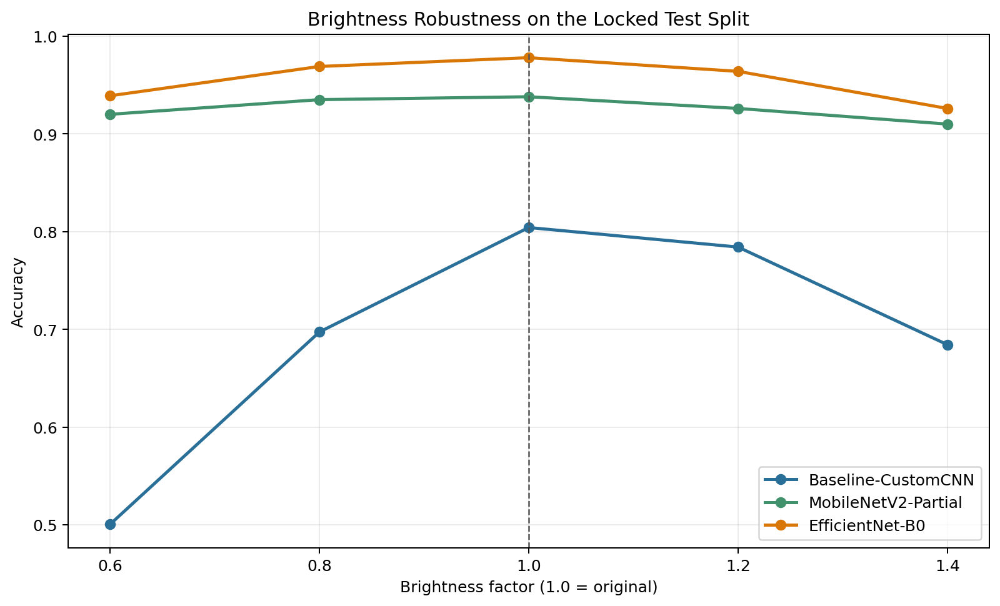

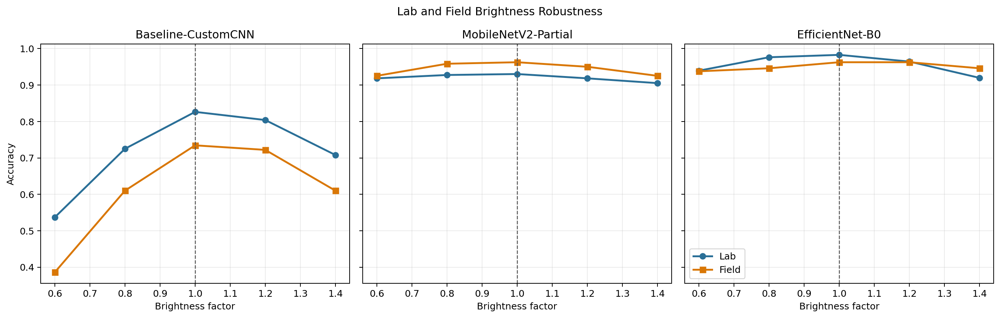

In [8]:
with (EXPERIMENT_DIR / "brightness_robustness_summary.csv").open(
    "r", encoding="utf-8", newline=""
) as csv_file:
    brightness_summary = list(csv.DictReader(csv_file))

print(
    f"{'model':<26} {'clean':>9} {'perturbed_mean':>16} "
    f"{'worst_factor':>14} {'max_drop':>10}"
)
for row in brightness_summary:
    print(
        f"{row['model']:<26} "
        f"{float(row['clean_accuracy']):>9.4f} "
        f"{float(row['mean_perturbed_accuracy']):>16.4f} "
        f"{float(row['worst_brightness_factor']):>14.1f} "
        f"{float(row['maximum_accuracy_drop']):>10.4f}"
    )

display(Image(filename=str(EXPERIMENT_DIR / "brightness_robustness.png")))
display(
    Image(filename=str(EXPERIMENT_DIR / "brightness_source_robustness.png"))
)

## 9. Error Analysis

High-confidence errors show that confidence alone is not a reliable failure
detector. EfficientNet-B0 predicts one field `ulmus_pumila` image as
`ulmus_rubra` with 99.04% confidence and one `ulmus_americana` image as
`ostrya_virginiana` with 98.80% confidence. Errors also occur when scale,
framing, or partial leaves reduce the available shape evidence.

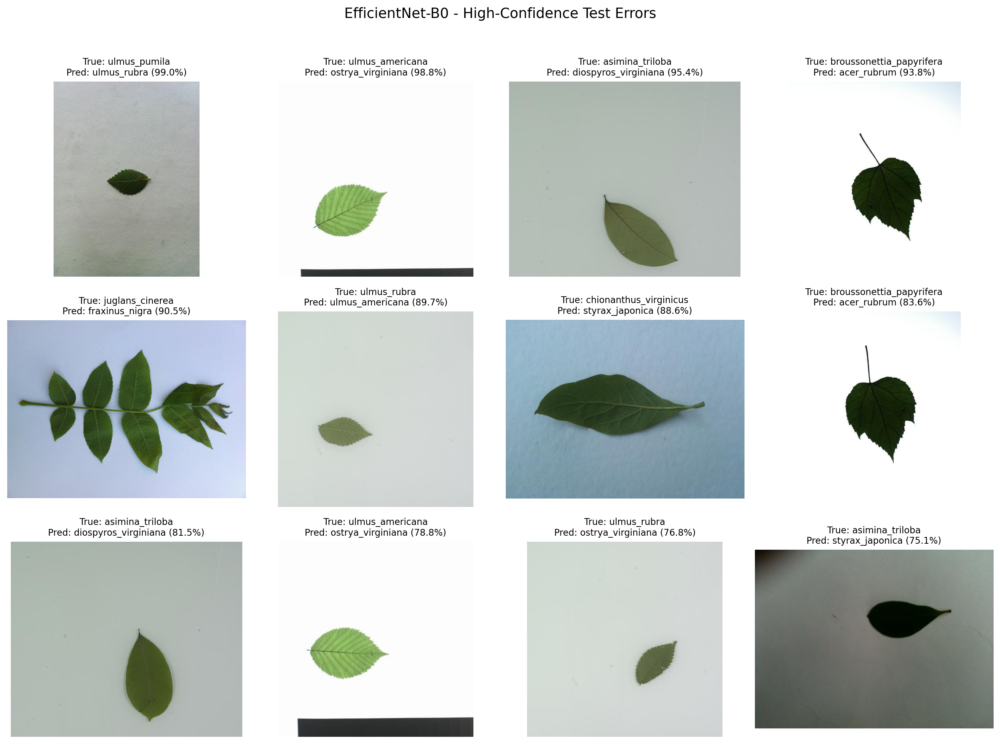

In [9]:
display(
    NotebookImage(
        filename=str(REPORT_FIGURE_DIR / "efficientnet_b0_error_cases.png")
    )
)

## 10. Grad-CAM

Grad-CAM uses `model.features[3][3]` for the Baseline, `model.features[-1]` for
MobileNetV2, and `model.features[-1][0]` for EfficientNet-B0. Correct examples
generally activate over leaf bodies, outlines, veins, or leaflet arrangements.
Incorrect examples can still focus on meaningful leaf regions, indicating that
the model may see the object but map shared morphology to the wrong species.
Grad-CAM is qualitative attention evidence, not a causal explanation.

baseline Grad-CAM


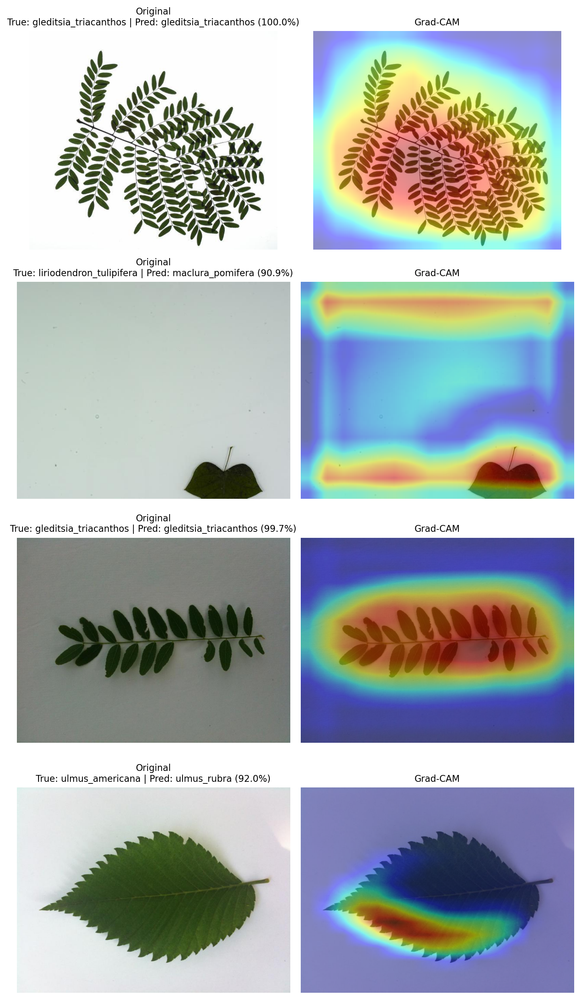

mobilenetv2 Grad-CAM


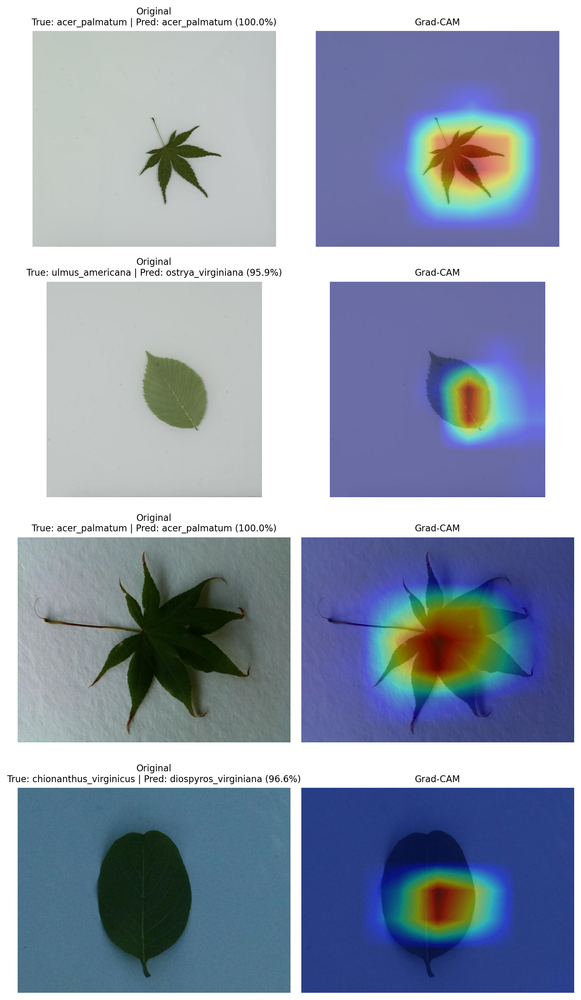

efficientnet_b0 Grad-CAM


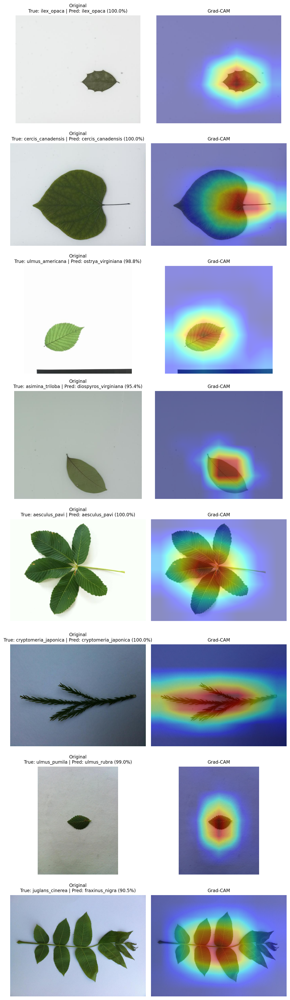

In [10]:
for model_name in ("baseline", "mobilenetv2", "efficientnet_b0"):
    print(f"{model_name} Grad-CAM")
    display(
        NotebookImage(
            filename=str(
                REPORT_FIGURE_DIR / f"{model_name}_gradcam_examples.png"
            )
        )
    )

## 11. Discussion

Transfer learning produces the main performance gain. EfficientNet-B0 improves
headline accuracy by 17.28 points over the Baseline and 4.00 points over
MobileNetV2. It was chosen from the EfficientNet-B0 and ResNet18 candidates by
the declared validation-first protocol. MobileNetV2 remains the smallest
transfer model, while EfficientNet-B0 provides the best accuracy with 4.05M
parameters.

Remaining mistakes concentrate in morphologically similar species, especially
`Ulmus` and `Ostrya`. The Baseline's large lab-to-field gap and darkening loss
show greater dependence on controlled acquisition. High-confidence transfer
model errors still motivate calibration and expert review for ambiguous leaves.

## 12. Limitations and Future Work

The test set is internal to the Leafsnap subset, and only 241 field images with
29 represented classes are available. Global brightness does not cover local
shadows, glare, color shifts, blur, or seasonal variation. CPU latency comes
from one machine and cannot predict mobile, CUDA, or optimized-runtime speed.
Grad-CAM is qualitative. Finally, the Baseline headline result and local
post-hoc result differ by one prediction and are kept separate.

Future work should collect a larger external field set, evaluate calibration,
add shadow and color-shift tests, investigate objectives for similar species,
and benchmark exported models on the intended deployment hardware.

## 13. Conclusion

EfficientNet-B0 is the recommended final model. It achieves 97.80% test
accuracy, 97.94% Macro-F1, and 96.27% field accuracy. Its maximum local
brightness drop is 5.19 points. MobileNetV2 is a compact alternative at 93.81%
accuracy; the Baseline is smaller and faster but much less accurate and robust.
The main remaining failure mode is confident confusion between visually
similar species.